# Basic Setup and Troubleshooting

In [1]:
!unzip archive.zip
import pandas as pd

Archive:  archive.zip
  inflating: Car_sales.csv           


In [2]:
df = pd.read_csv("Car_sales.csv")

In [3]:
df.info()
df.describe()
print(f"null values total: {df.isna().sum().sum()}")
for x in df.columns:
  print(f"null values in {x} = {df[x].isna().sum()}")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 157 entries, 0 to 156
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Manufacturer         157 non-null    object 
 1   Model                157 non-null    object 
 2   Sales_in_thousands   157 non-null    float64
 3   __year_resale_value  121 non-null    float64
 4   Vehicle_type         157 non-null    object 
 5   Price_in_thousands   155 non-null    float64
 6   Engine_size          156 non-null    float64
 7   Horsepower           156 non-null    float64
 8   Wheelbase            156 non-null    float64
 9   Width                156 non-null    float64
 10  Length               156 non-null    float64
 11  Curb_weight          155 non-null    float64
 12  Fuel_capacity        156 non-null    float64
 13  Fuel_efficiency      154 non-null    float64
 14  Latest_Launch        157 non-null    object 
 15  Power_perf_factor    155 non-null    flo

Resale value has a very high amount of NaN values, so we should take that into account when doing analysis


In [7]:
df = df.fillna(df.mean())

<ipython-input-7-04e87d67d337>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df = df.fillna(df.mean())


Filled the resale value with the median for the respective column. This will have to be taken into account when intepreting the results, but mostly for the __year_resale_value column as it has the highest (22%) amount of NaN values

In [47]:
df.describe()

,Manufacturer,Model,Sales_in_thousands,__year_resale_value,Vehicle_type,Price_in_thousands,Engine_size,Horsepower,Wheelbase,Width,Length,Curb_weight,Fuel_capacity,Fuel_efficiency,Power_perf_factor,year,month,Engine_Curb
count,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.00000,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000
mean,15.541401,78.229299,52.998076,18.072975,1.261146,27.390755,3.060897,185.948718,107.487179,71.15000,187.343590,3.378026,17.951923,23.844156,77.043591,2011.433121,6.375796,6.438923
std,8.602691,45.159954,68.029422,10.045282,0.440665,14.259359,1.041299,56.518297,7.616772,3.44079,13.388635,0.626447,3.875440,4.241326,24.980973,0.633204,3.378693,1.568856
min,1.000000,1.000000,0.110000,5.160000,1.000000,9.235000,1.000000,55.000000,92.600000,62.60000,149.400000,1.895000,10.300000,15.000000,23.276272,2008.000000,1.000000,2.895000
25%,8.000000,39.000000,14.114000,12.545000,1.000000,18.145000,2.300000,150.000000,103.000000,68.40000,177.600000,2.975000,15.800000,21.000000,60.727447,2011.000000,4.000000,5.275000
50%,16.000000,78.000000,29.450000,17.710000,1.000000,23.400000,3.000000,180.000000,107.000000,70.60000,187.800000,3.368000,17.200000,24.000000,72.290355,2011.000000,6.000000,6.368000
75%,22.000000,117.000000,67.956000,18.140000,2.000000,31.930000,3.500000,215.000000,112.200000,73.40000,196.100000,3.778000,19.500000,26.000000,89.401935,2012.000000,9.000000,7.342000
max,30.000000,156.000000,540.561000,67.550000,2.000000,85.500000,8.000000,450.000000,138.700000,79.90000,224.500000,5.572000,32.000000,45.000000,188.144323,2012.000000,12.000000,11.375000


In [48]:
df.columns

Index(['Manufacturer', 'Model', 'Sales_in_thousands', '__year_resale_value',
       'Vehicle_type', 'Price_in_thousands', 'Engine_size', 'Horsepower',
       'Wheelbase', 'Width', 'Length', 'Curb_weight', 'Fuel_capacity',
       'Fuel_efficiency', 'Latest_Launch', 'Power_perf_factor', 'year',
       'month', 'Engine_Curb'],
      dtype='object')

In [5]:
for x in df:
  print(x)
  print(df[x].unique())
  print(df[x].value_counts())

Manufacturer
['Acura' 'Audi' 'BMW' 'Buick' 'Cadillac' 'Chevrolet' 'Chrysler' 'Dodge'
 'Ford' 'Honda' 'Hyundai' 'Infiniti' 'Jaguar' 'Jeep' 'Lexus' 'Lincoln'
 'Mitsubishi' 'Mercury' 'Mercedes-B' 'Nissan' 'Oldsmobile' 'Plymouth'
 'Pontiac' 'Porsche' 'Saab' 'Saturn' 'Subaru' 'Toyota' 'Volkswagen'
 'Volvo']
Dodge         11
Ford          11
Toyota         9
Chevrolet      9
Mercedes-B     9
Mitsubishi     7
Nissan         7
Chrysler       7
Volvo          6
Oldsmobile     6
Lexus          6
Mercury        6
Pontiac        6
Volkswagen     6
Saturn         5
Cadillac       5
Honda          5
Plymouth       4
Acura          4
Buick          4
Audi           3
Jeep           3
Porsche        3
Hyundai        3
BMW            3
Lincoln        3
Saab           2
Subaru         2
Jaguar         1
Infiniti       1
Name: Manufacturer, dtype: int64
Model
['Integra' 'TL' 'CL' 'RL' 'A4' 'A6' 'A8' '323i' '328i' '528i' 'Century'
 'Regal' 'Park Avenue' 'LeSabre' 'DeVille' 'Seville' 'Eldorado' 'Catera'
 '

All the features seems to be pretty unique except for vehicle type, but this might be a good thing actually as it may help with analysis down the line

In [9]:
def one_hot(df, column):
  new_list = {value: i+1 for i, value in enumerate(df[column].unique())}
  df.replace({column: new_list}, inplace=True)
  return new_list
manufacturers = one_hot(df, "Manufacturer")
model = one_hot(df, "Model")
types = one_hot(df, "Vehicle_type")
print(manufacturers)
print(model)
print(types)


{'Acura': 1, 'Audi': 2, 'BMW': 3, 'Buick': 4, 'Cadillac': 5, 'Chevrolet': 6, 'Chrysler': 7, 'Dodge': 8, 'Ford': 9, 'Honda': 10, 'Hyundai': 11, 'Infiniti': 12, 'Jaguar': 13, 'Jeep': 14, 'Lexus': 15, 'Lincoln': 16, 'Mitsubishi': 17, 'Mercury': 18, 'Mercedes-B': 19, 'Nissan': 20, 'Oldsmobile': 21, 'Plymouth': 22, 'Pontiac': 23, 'Porsche': 24, 'Saab': 25, 'Saturn': 26, 'Subaru': 27, 'Toyota': 28, 'Volkswagen': 29, 'Volvo': 30}
{'Integra': 1, 'TL': 2, 'CL': 3, 'RL': 4, 'A4': 5, 'A6': 6, 'A8': 7, '323i': 8, '328i': 9, '528i': 10, 'Century': 11, 'Regal': 12, 'Park Avenue': 13, 'LeSabre': 14, 'DeVille': 15, 'Seville': 16, 'Eldorado': 17, 'Catera': 18, 'Escalade': 19, 'Cavalier': 20, 'Malibu': 21, 'Lumina': 22, 'Monte Carlo': 23, 'Camaro': 24, 'Corvette': 25, 'Prizm': 26, 'Metro': 27, 'Impala': 28, 'Sebring Coupe': 29, 'Sebring Conv.': 30, 'Concorde': 31, 'Cirrus': 32, 'LHS': 33, 'Town & Country': 34, '300M': 35, 'Neon': 36, 'Avenger': 37, 'Stratus': 38, 'Intrepid': 39, 'Viper': 40, 'Ram Pickup

Here we are encoding the features to numeric values and storing the original value into a dictionary so we can more easily see later what is what

In [52]:
df['Latest_Launch'] = pd.to_datetime(df['Latest_Launch'])
df['year'] = df['Latest_Launch'].dt.year
df['month'] = df['Latest_Launch'].dt.month

Its easier to handle date stuff if we convert it to numerical form. Added a year and month feature to do so

In [8]:
df

,Manufacturer,Model,Sales_in_thousands,__year_resale_value,Vehicle_type,Price_in_thousands,Engine_size,Horsepower,Wheelbase,Width,Length,Curb_weight,Fuel_capacity,Fuel_efficiency,Latest_Launch,Power_perf_factor,year,month
0,1,1,16.919,16.360000,1,21.500000,1.8,140.0,101.2,67.3,172.4,2.639,13.2,28.0,2012-02-02,58.280150,2012,2
1,1,2,39.384,19.875000,1,28.400000,3.2,225.0,108.1,70.3,192.9,3.517,17.2,25.0,2011-06-03,91.370778,2011,6
2,1,3,14.114,18.225000,1,27.390755,3.2,225.0,106.9,70.6,192.0,3.470,17.2,26.0,2012-01-04,77.043591,2012,1
3,1,4,8.588,29.725000,1,42.000000,3.5,210.0,114.6,71.4,196.6,3.850,18.0,22.0,2011-03-10,91.389779,2011,3
4,2,5,20.397,22.255000,1,23.990000,1.8,150.0,102.6,68.2,178.0,2.998,16.4,27.0,2011-10-08,62.777639,2011,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152,30,152,3.545,18.072975,1,24.400000,1.9,160.0,100.5,67.6,176.6,3.042,15.8,25.0,2011-09-21,66.498812,2011,9
153,30,153,15.245,18.072975,1,27.500000,2.4,168.0,104.9,69.3,185.9,3.208,17.9,25.0,2012-11-24,70.654495,2012,11
154,30,154,17.531,18.072975,1,28.800000,2.4,168.0,104.9,69.3,186.2,3.259,17.9,25.0,2011-06-25,71.155978,2011,6
155,30,155,3.493,18.072975,1,45.500000,2.3,236.0,104.9,71.5,185.7,3.601,18.5,23.0,2011-04-26,101.623357,2011,4


# Basic Visualization

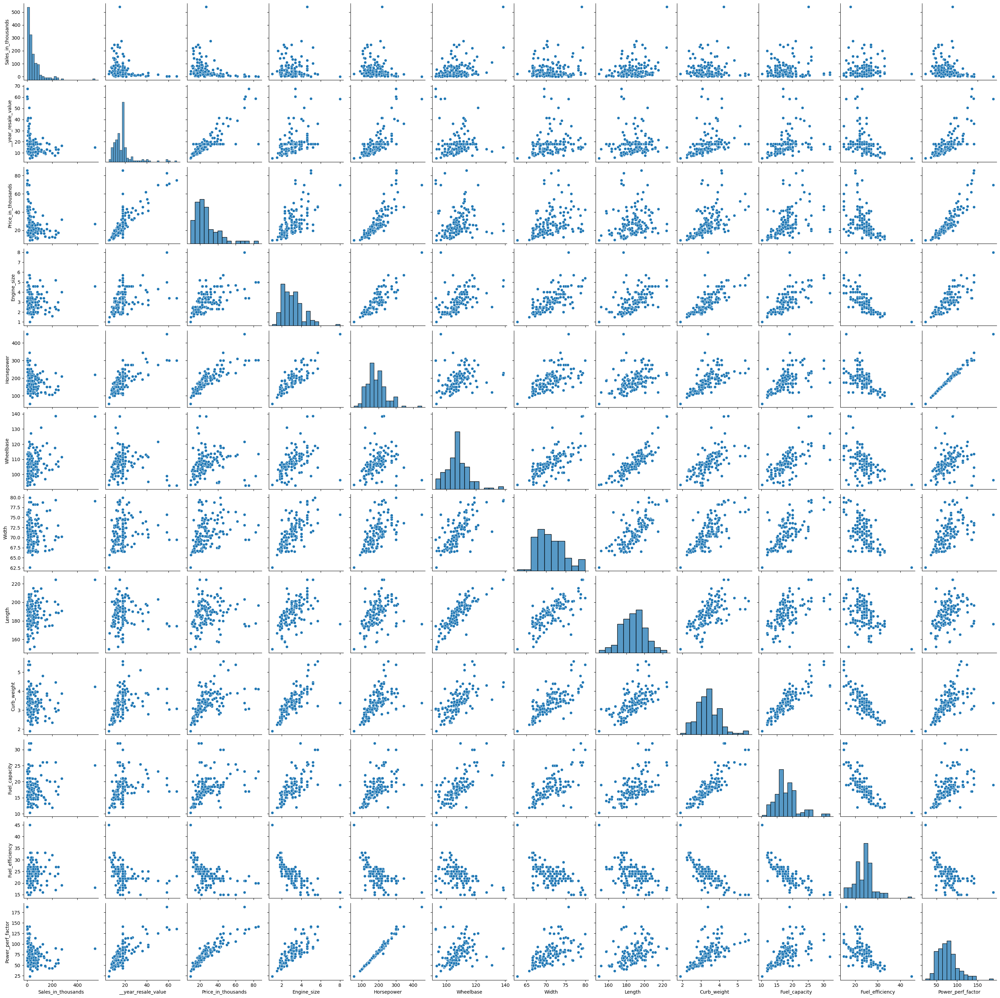

In [68]:
import seaborn as sns
sns.pairplot(df.drop(['year', 'month', 'Manufacturer', 'Model', 'Vehicle_type'], axis=1))

Notes:
* Doesn't appear to be any observable correlation between the features and their sales in thousands
* Sales-based data seems to be grouped together, with some outliers

<Axes: xlabel='Sales_in_thousands', ylabel='__year_resale_value'>

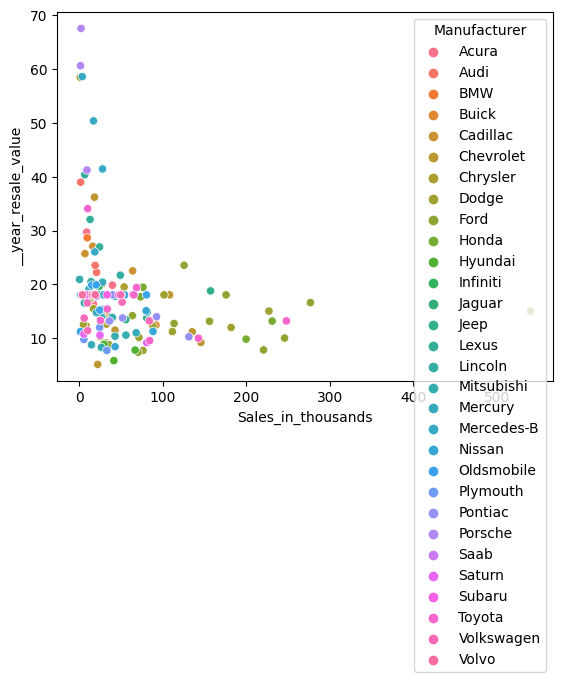

In [53]:
import seaborn as sns
sns.scatterplot(x='Sales_in_thousands', y='__year_resale_value', hue='Manufacturer', palette=sns.color_palette("husl", 30),  data=df)
#https://seaborn.pydata.org/generated/seaborn.color_palette.html#seaborn.color_palette

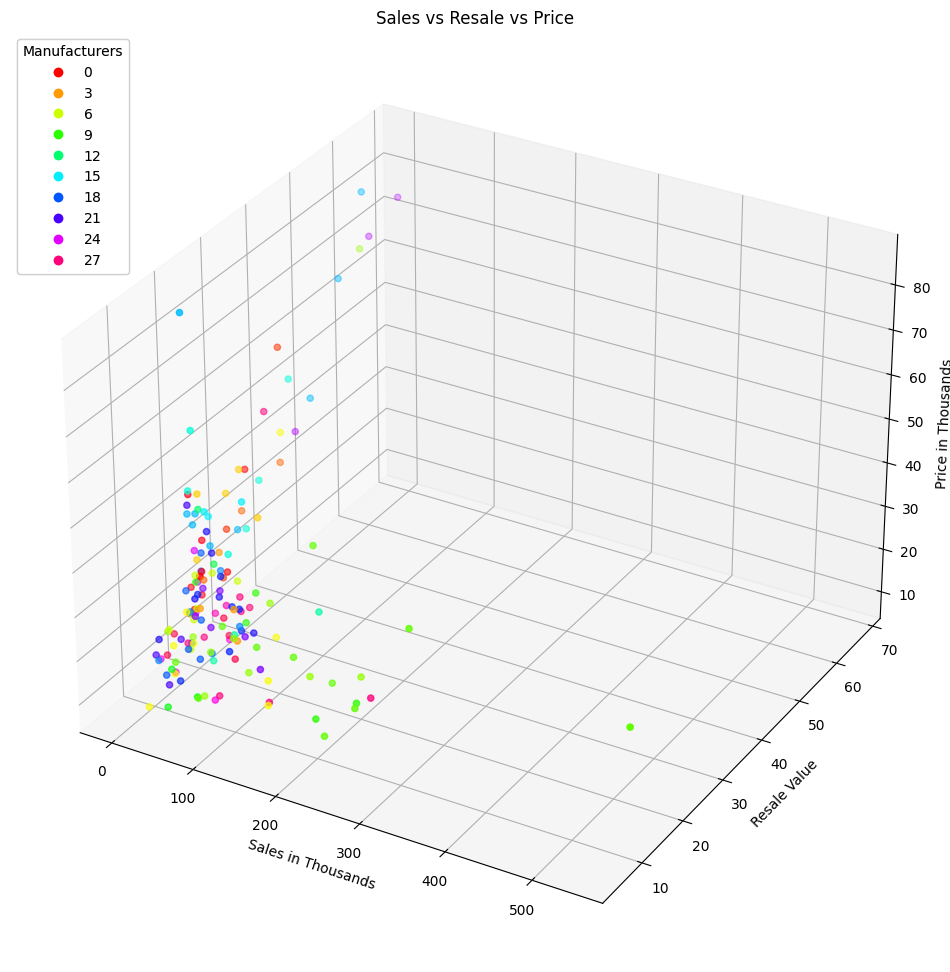

In [59]:
fig = plt.figure(figsize=(12, 14))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df['Sales_in_thousands'], df['__year_resale_value'], df['Price_in_thousands'], c=df['Manufacturer'].astype('category').cat.codes, cmap='hsv', marker='o')
legend = ax.legend(*scatter.legend_elements(), title='Manufacturers', loc='upper left')
ax.add_artist(legend)
ax.set_xlabel('Sales in Thousands')
ax.set_ylabel('Resale Value')
ax.set_zlabel('Price in Thousands')
ax.set_title('Sales vs Resale vs Price')
plt.show()
#https://innovationyourself.com/3d-data-visualization-seaborn-in-python/
#https://matplotlib.org/stable/gallery/lines_bars_and_markers/scatter_with_legend.html

It is intuitive that cars with high resale value have a higher initial price (high price reduced due to resale would logically be more than a car with a low price reduced), but it is interesting to see that most cars being sold have a fairly low amount of sales

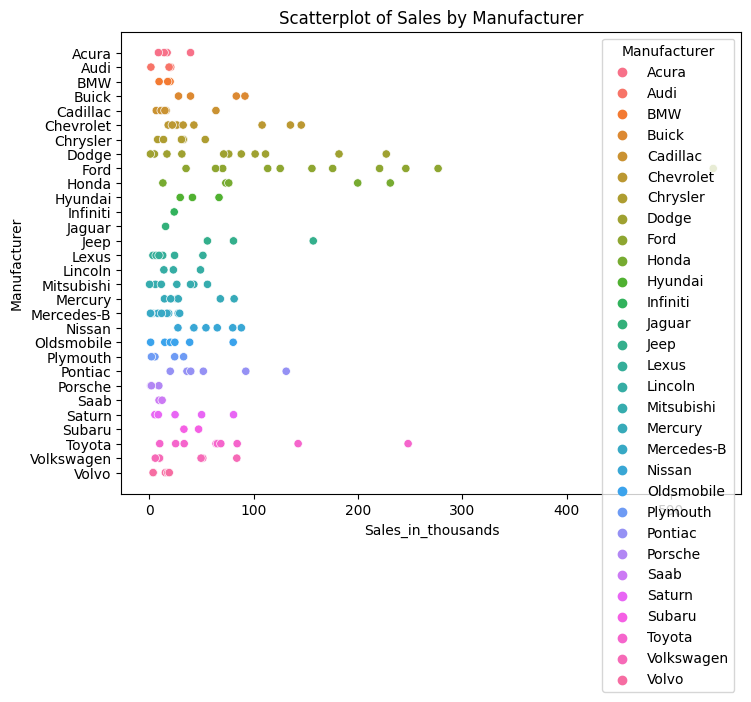

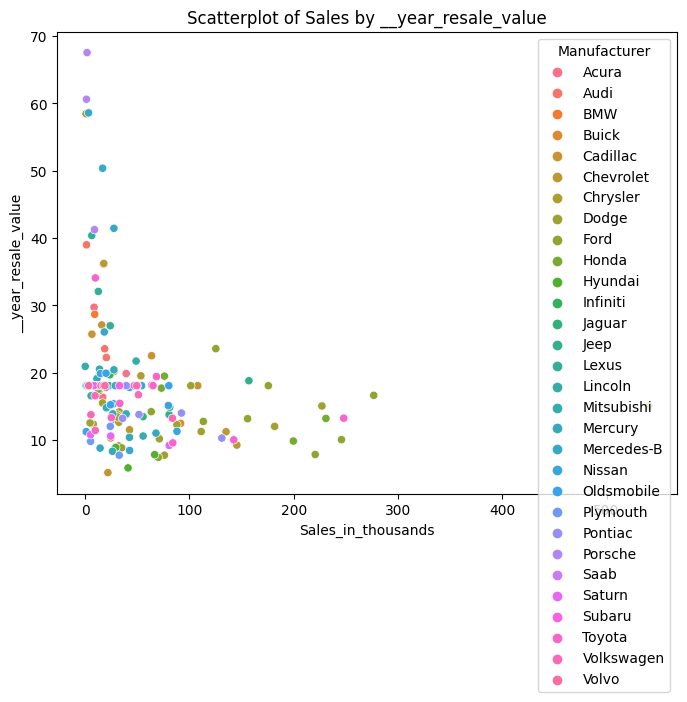

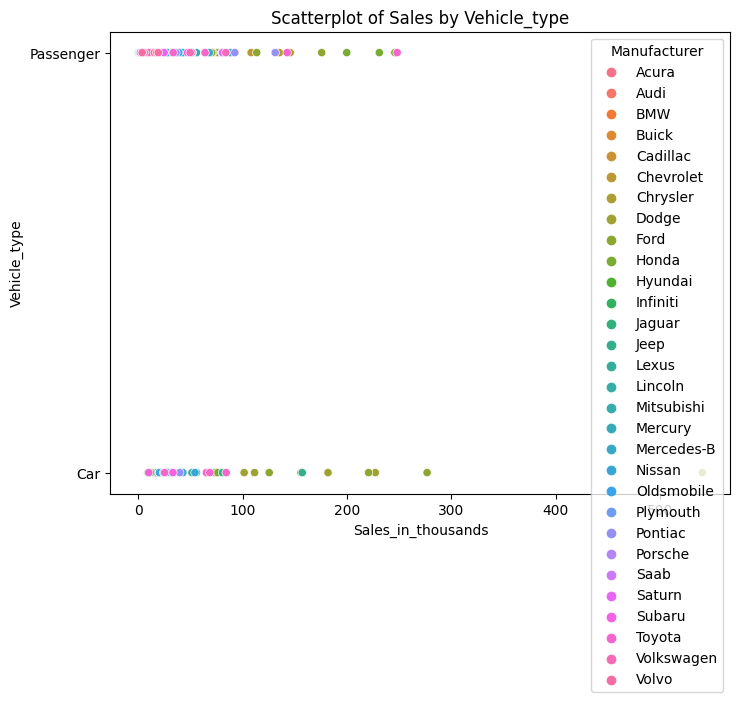

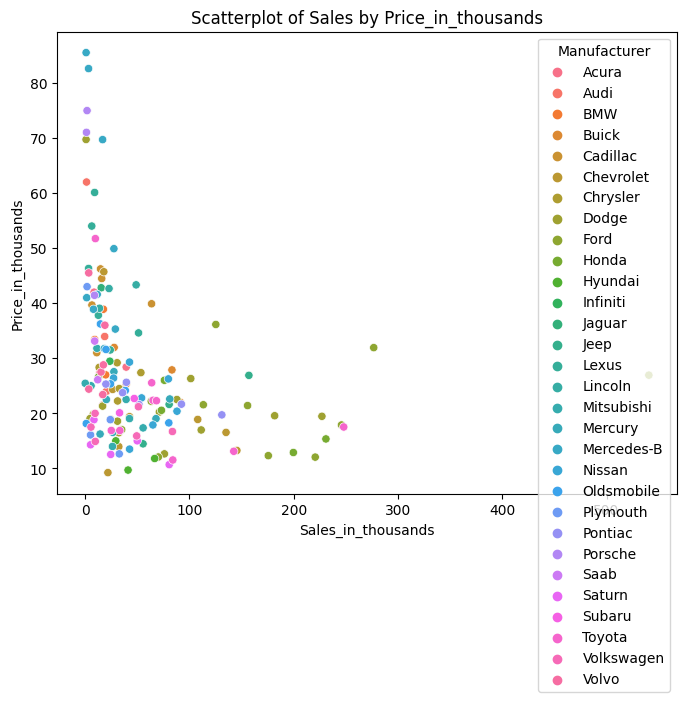

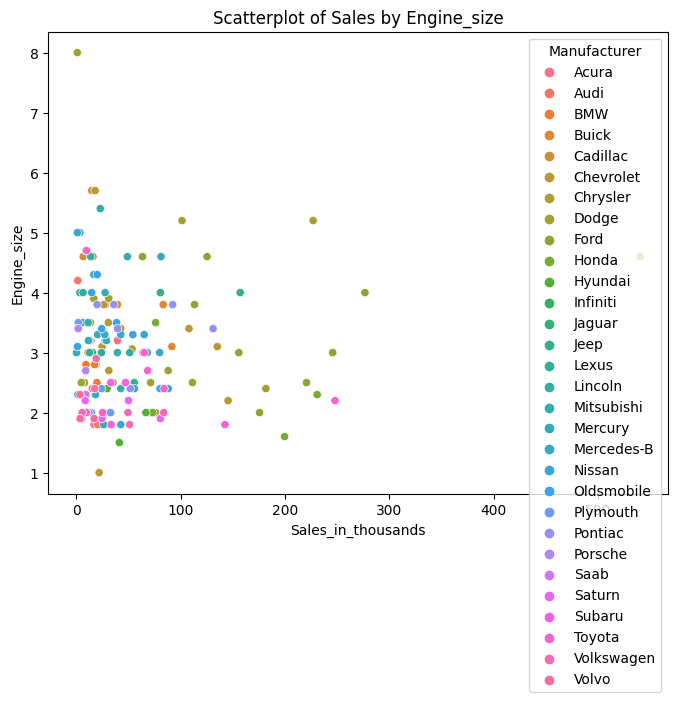

...

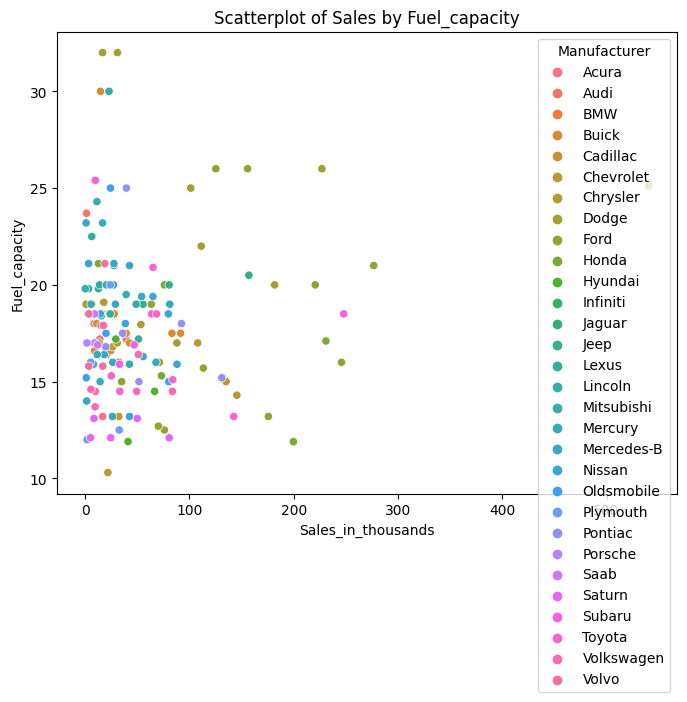

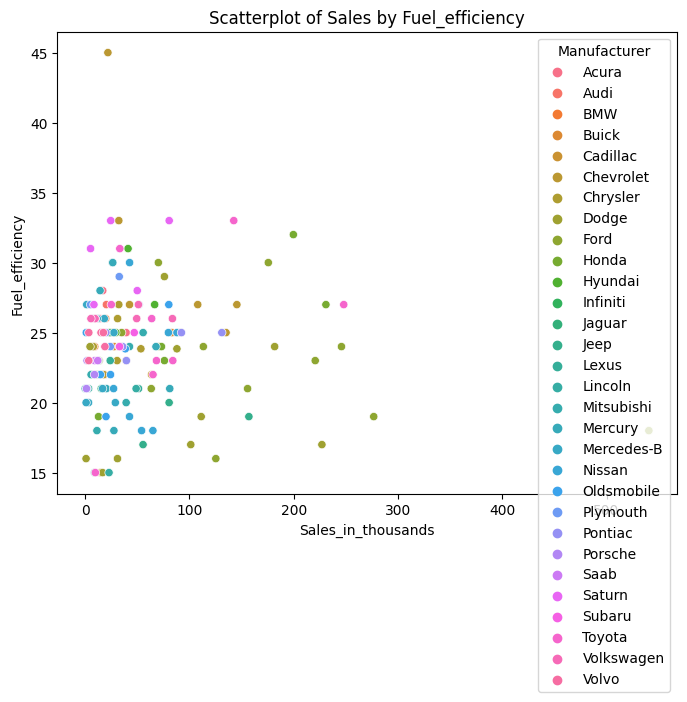

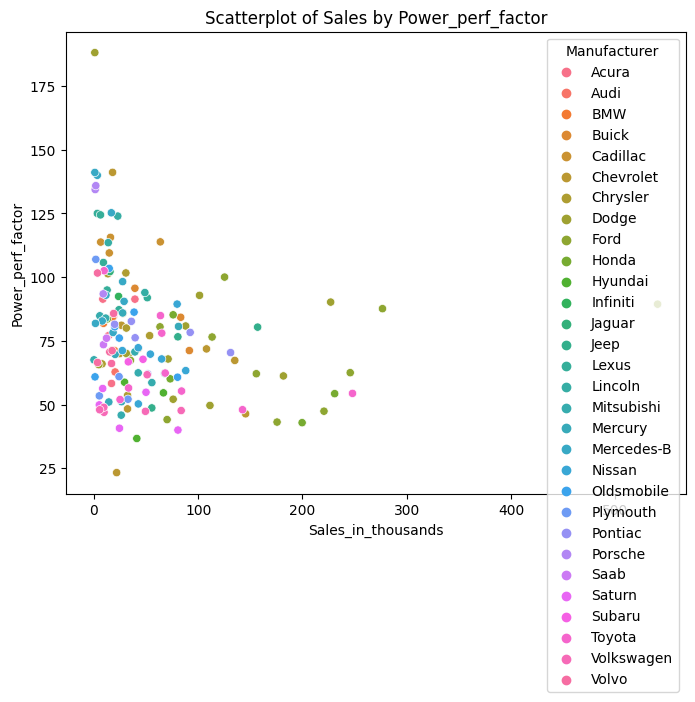

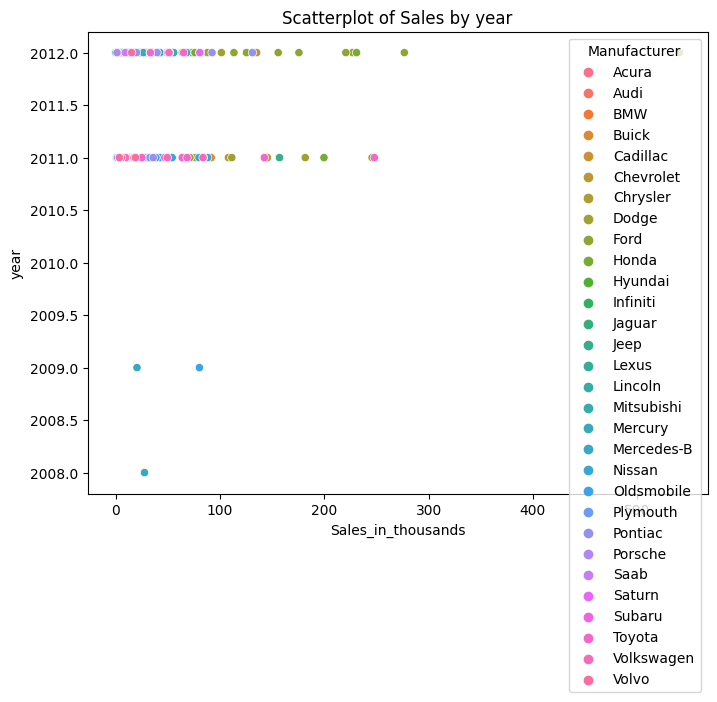

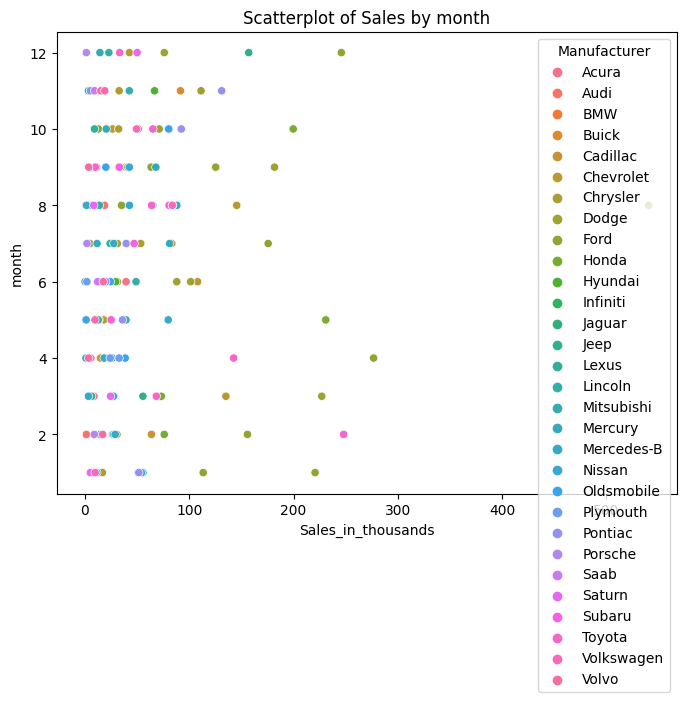

In [61]:
import matplotlib.pyplot as plt
for column in df.columns:
    if column == 'Sales_in_thousands' or column == 'Latest_Launch' or column == 'Model':
      continue
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='Sales_in_thousands', y=column, hue='Manufacturer', palette=sns.color_palette("husl", 30),  data=df)
    plt.title(f'Scatterplot of Sales by {column}')
    plt.show()

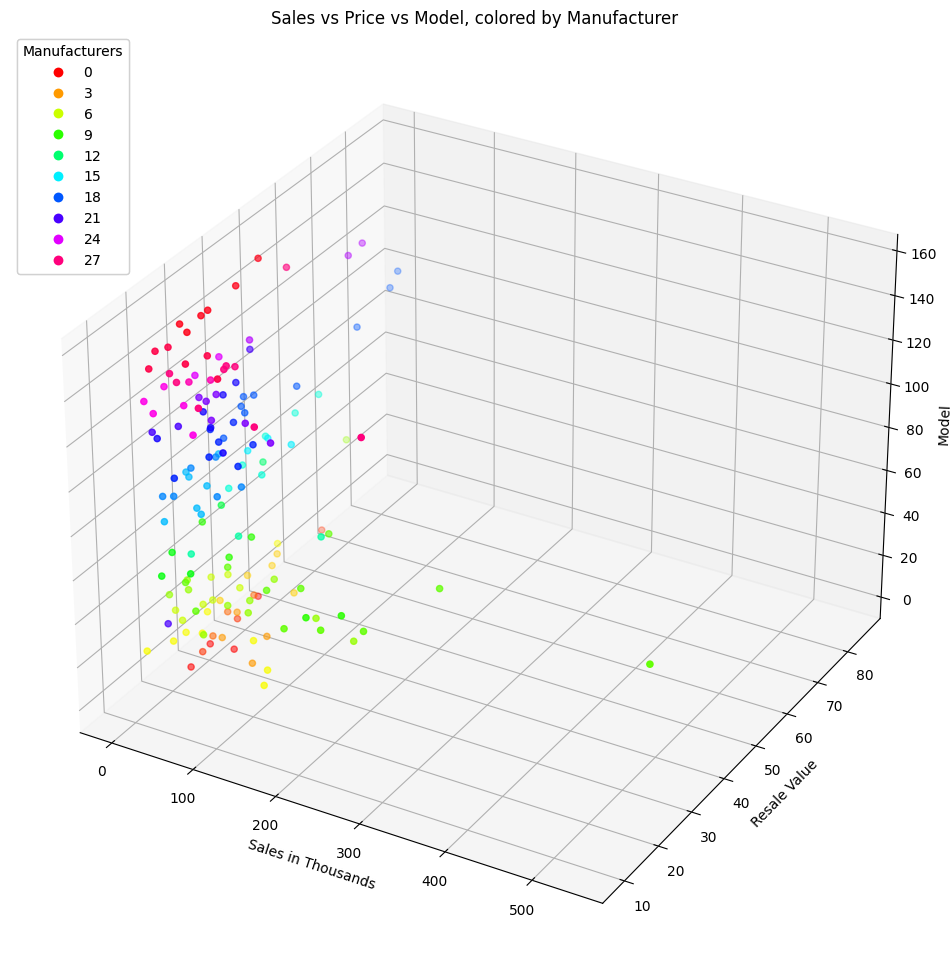

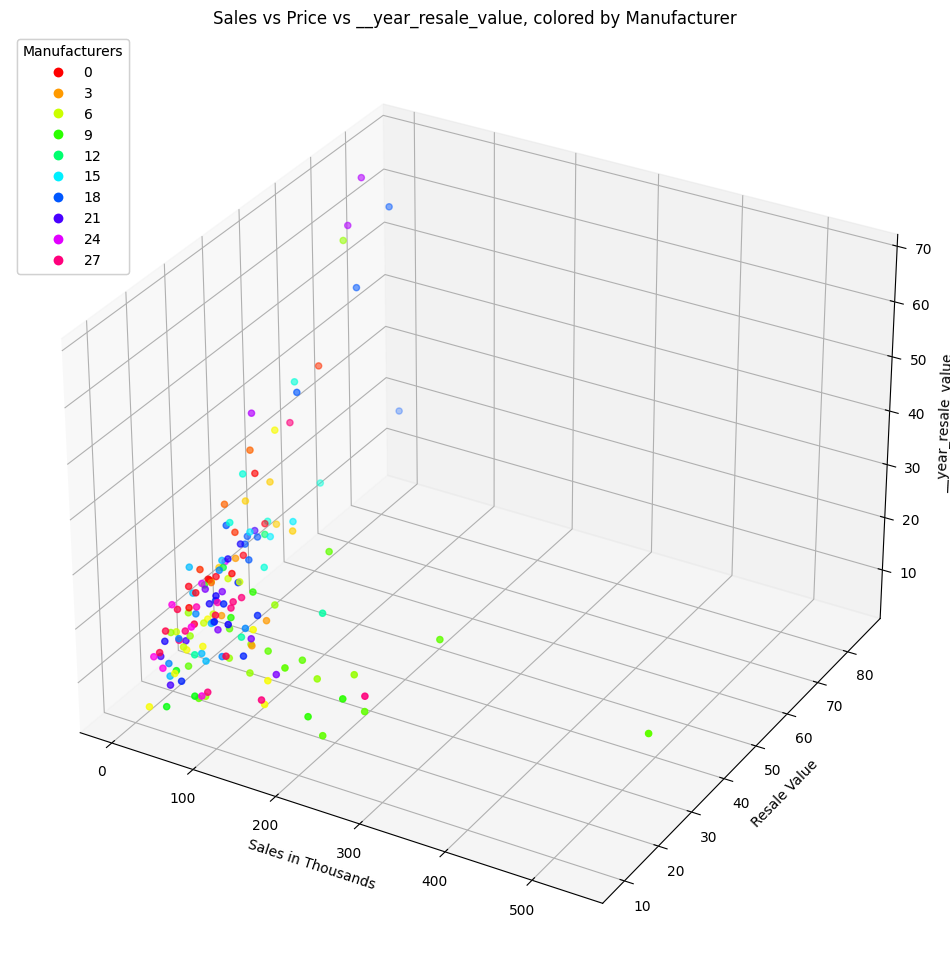

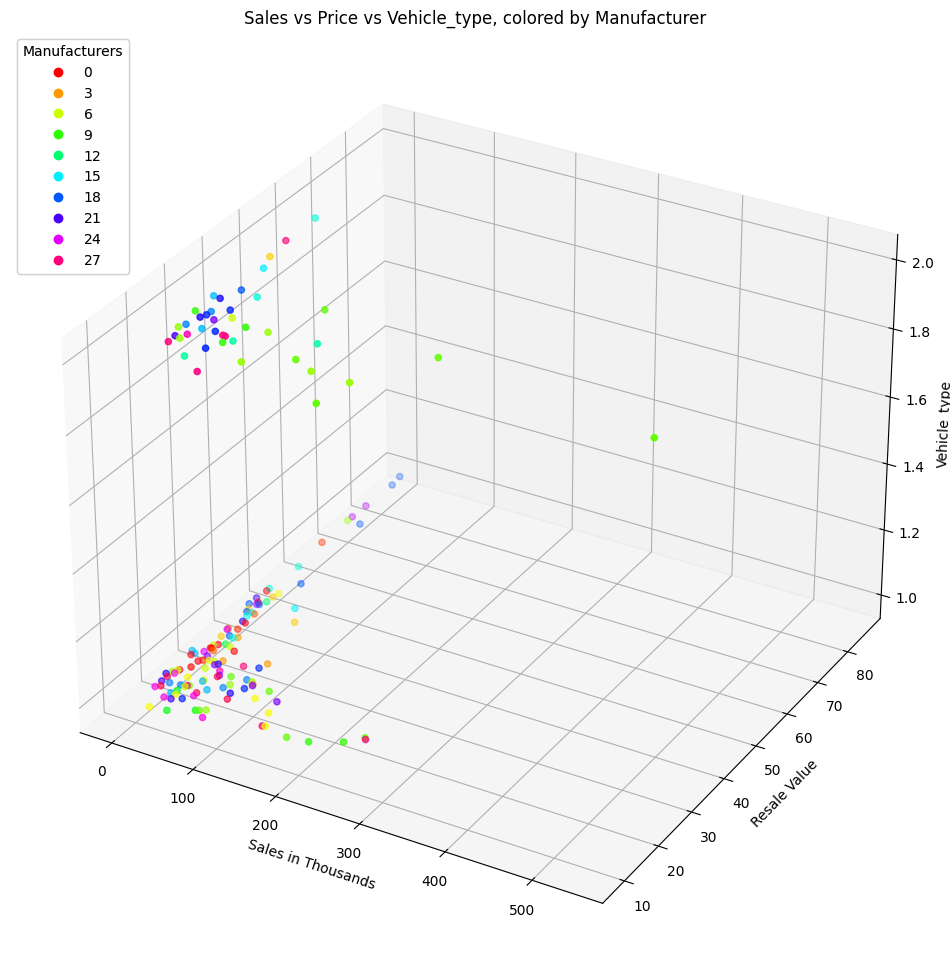

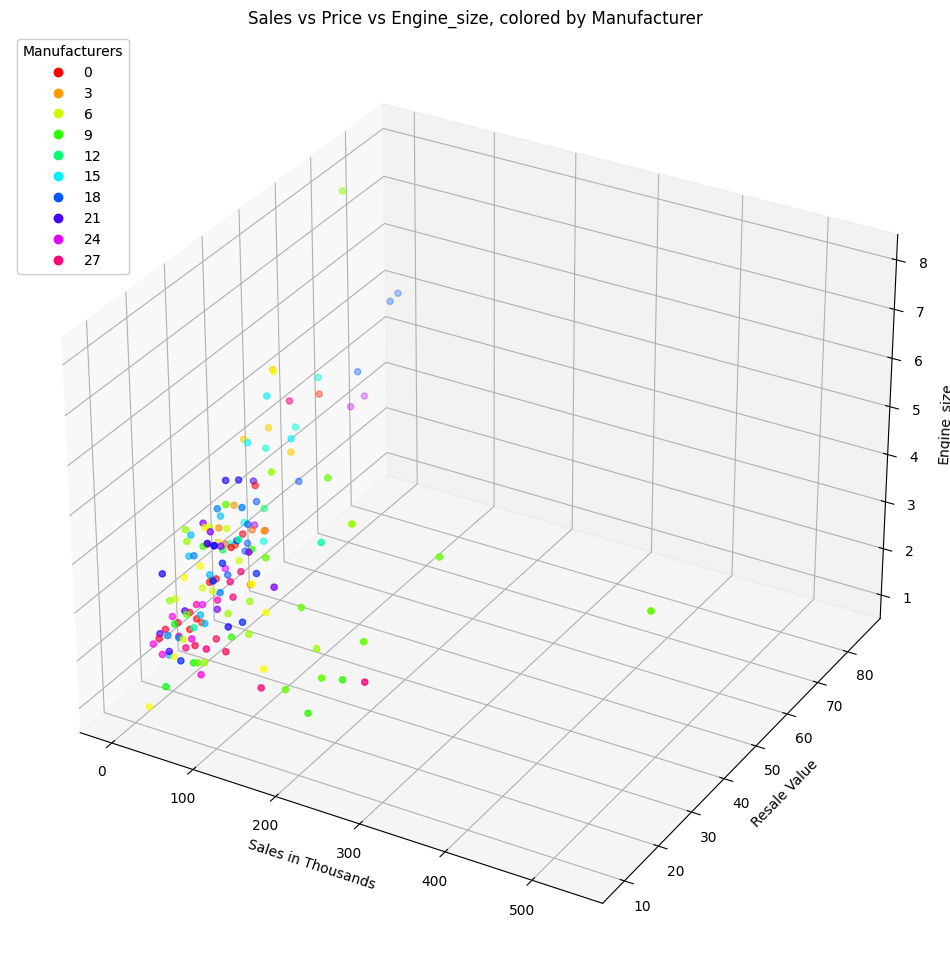

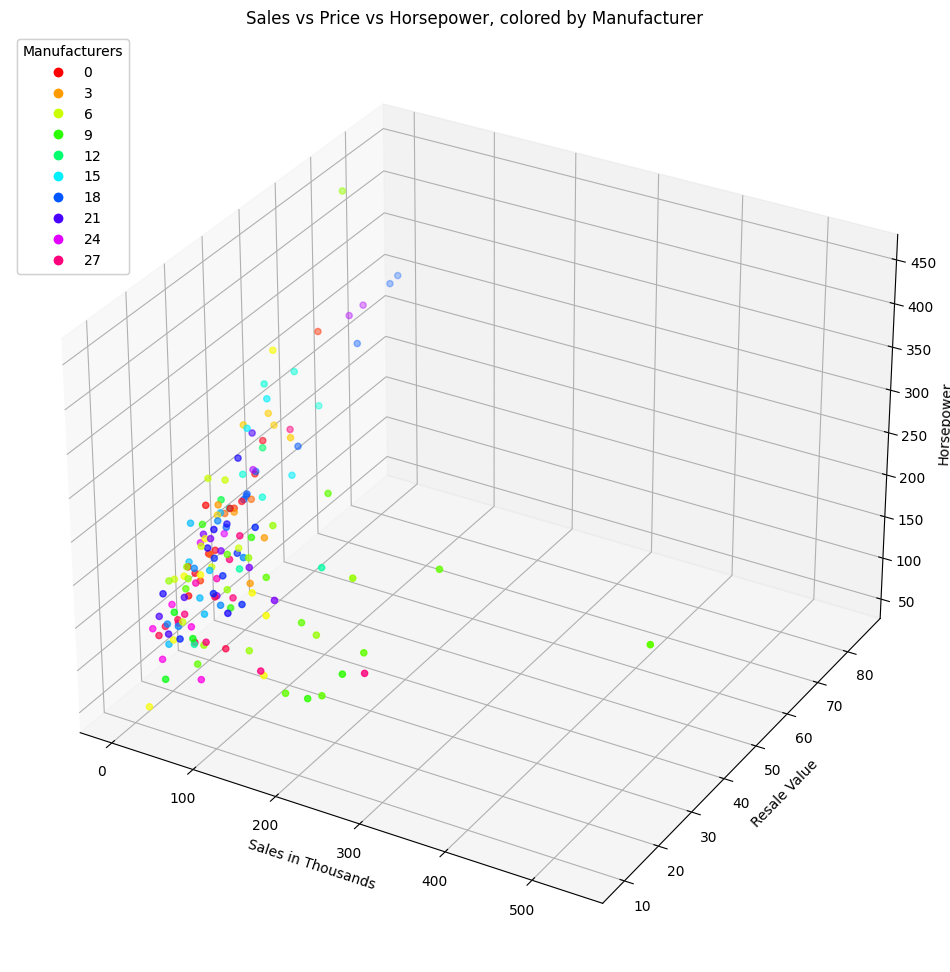

...

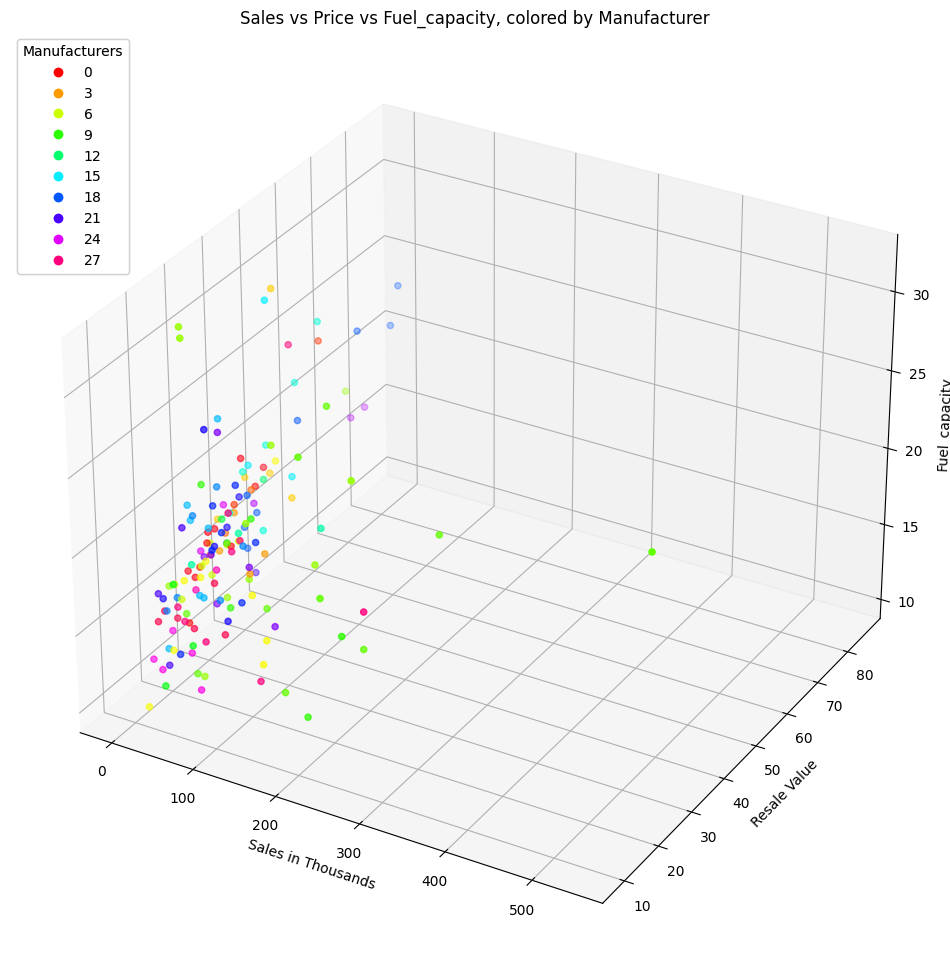

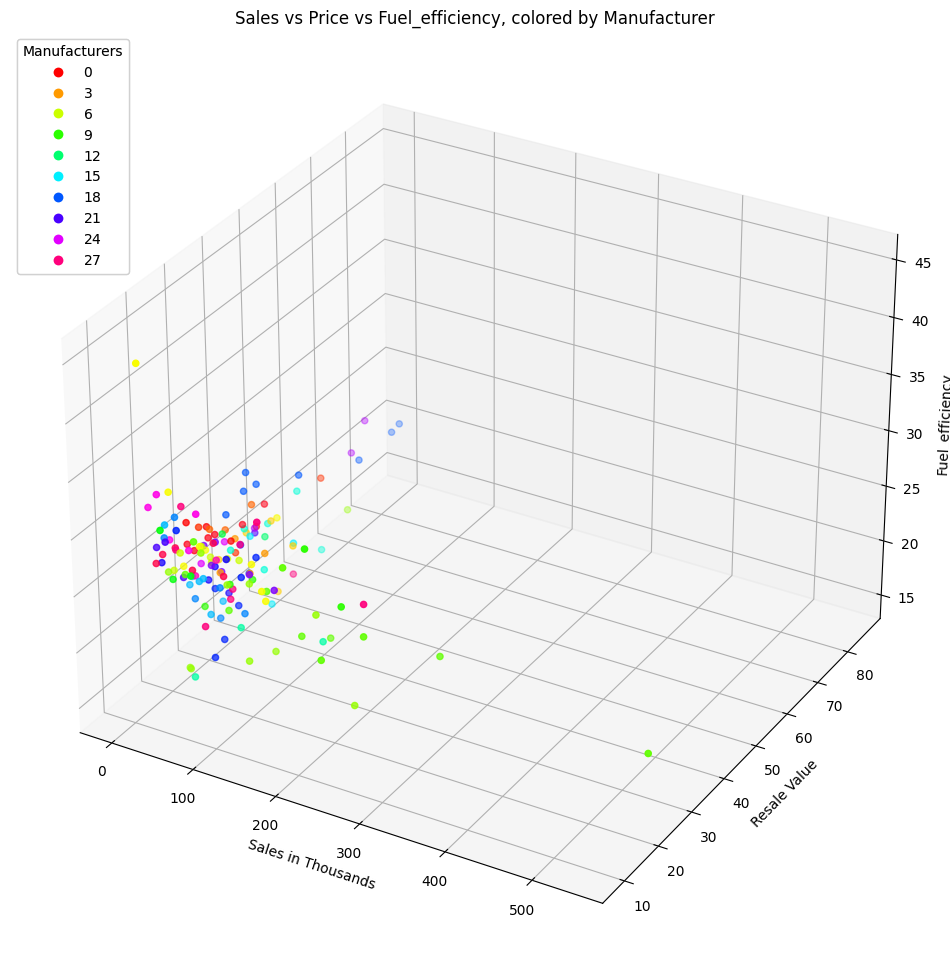

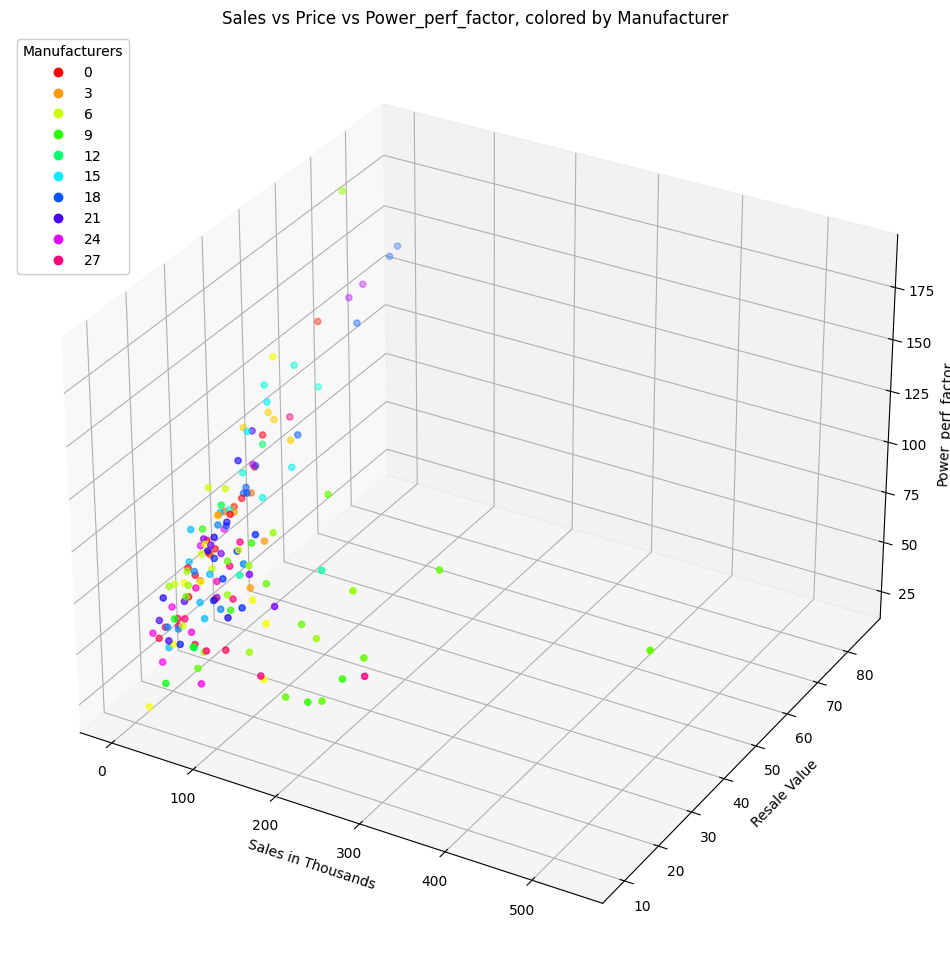

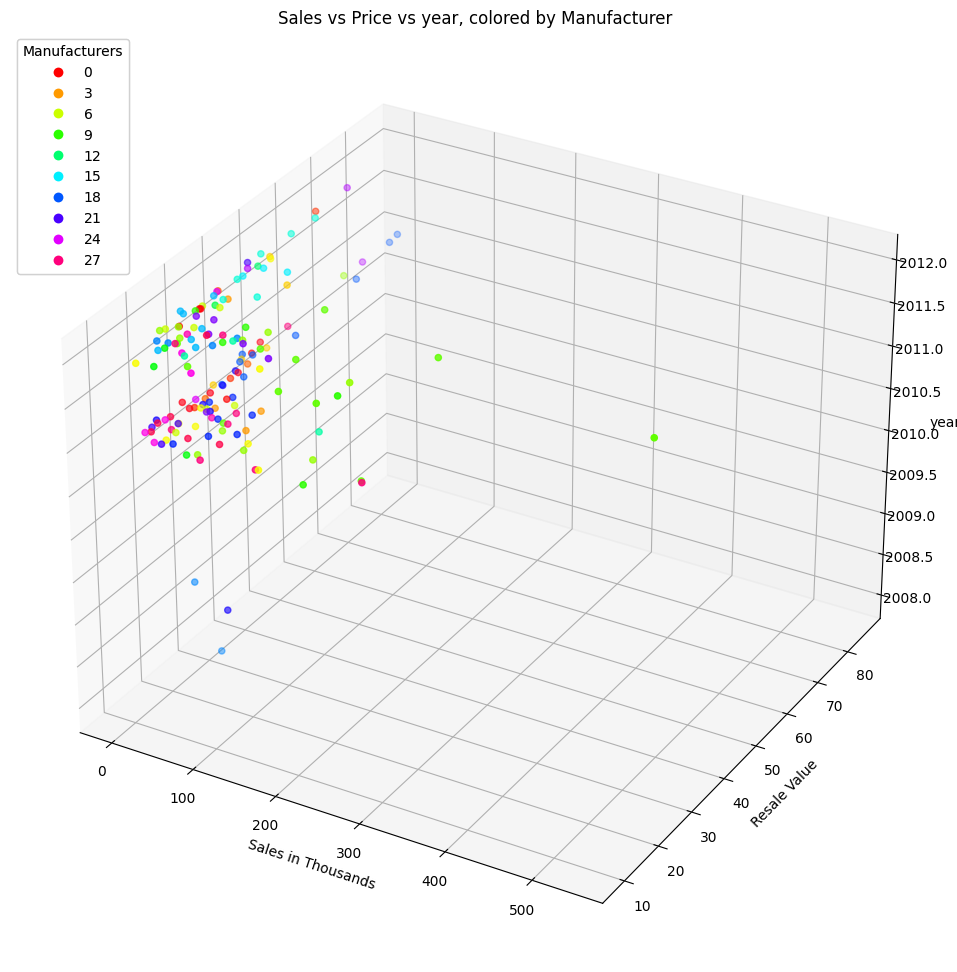

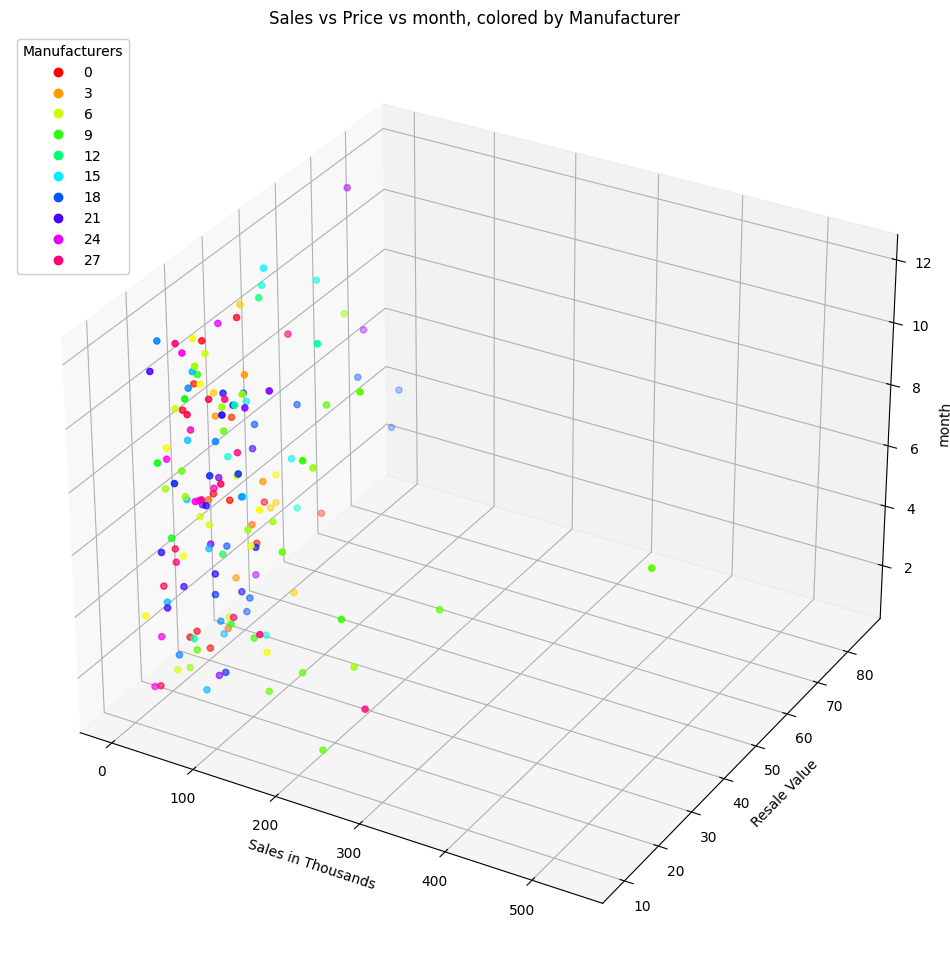

In [64]:
for column in df.columns:
    if column == 'Sales_in_thousands' or column == 'Latest_Launch' or column == 'Manufacturer' or column == 'Price_in_thousands':
      continue
    fig = plt.figure(figsize=(12, 14))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(df['Sales_in_thousands'], df['Price_in_thousands'], df[column] , c=df['Manufacturer'].astype('category').cat.codes, cmap='hsv', marker='o')
    legend = ax.legend(*scatter.legend_elements(), title='Manufacturers', loc='upper left')
    ax.add_artist(legend)
    ax.set_xlabel('Sales in Thousands')
    ax.set_ylabel('Resale Value')
    ax.set_zlabel(column)
    ax.set_title(f'Sales vs Price vs {column}, colored by Manufacturer')
    plt.show()

Type 1 cars seem to have higher sales in some capacity

# PCA Setup

<Axes: xlabel='0', ylabel='1'>

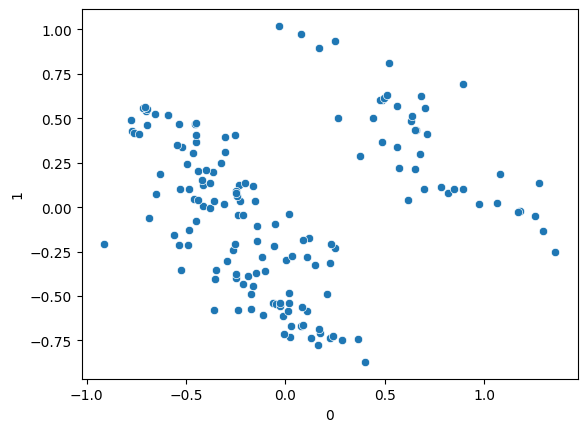

In [10]:
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.preprocessing import MinMaxScaler
data = df.drop(['Latest_Launch'], axis=1)
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data)
from sklearn.decomposition import PCA
pca = PCA(n_components = 2)
pca_data = pca.fit_transform(data_scaled)
pca_df = pd.DataFrame(pca_data)
sns.scatterplot(x = pca_df[0], y = pca_df[1])
#https://mikulskibartosz.name/pca-how-to-choose-the-number-of-components

# PCA Visualization

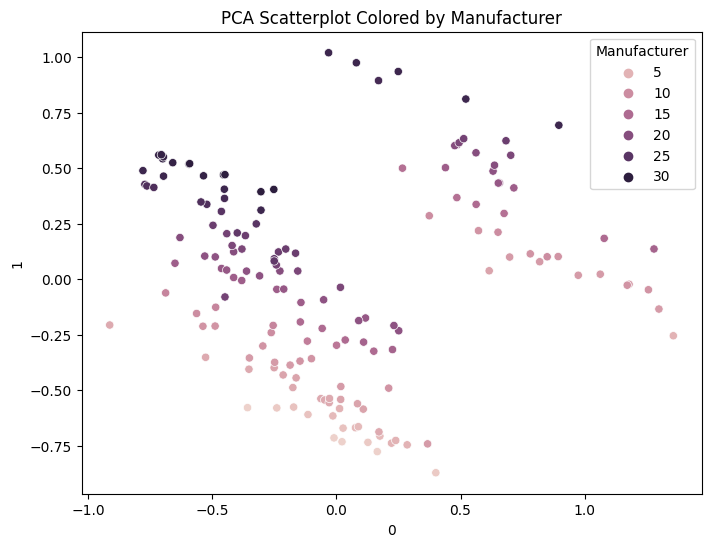

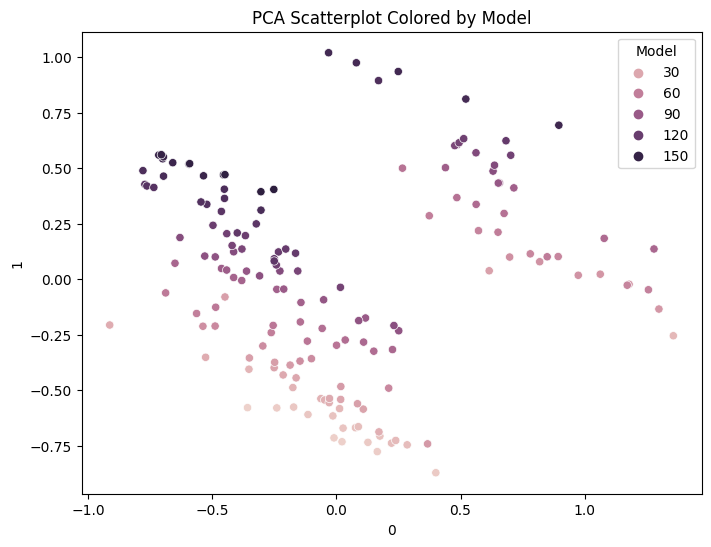

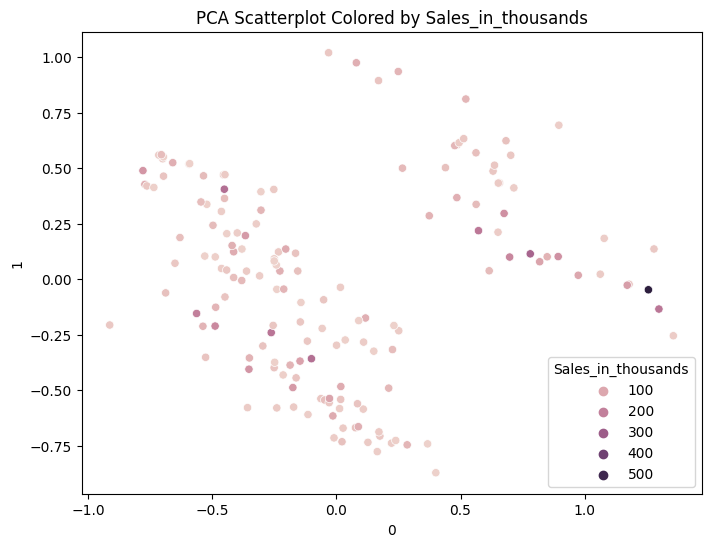

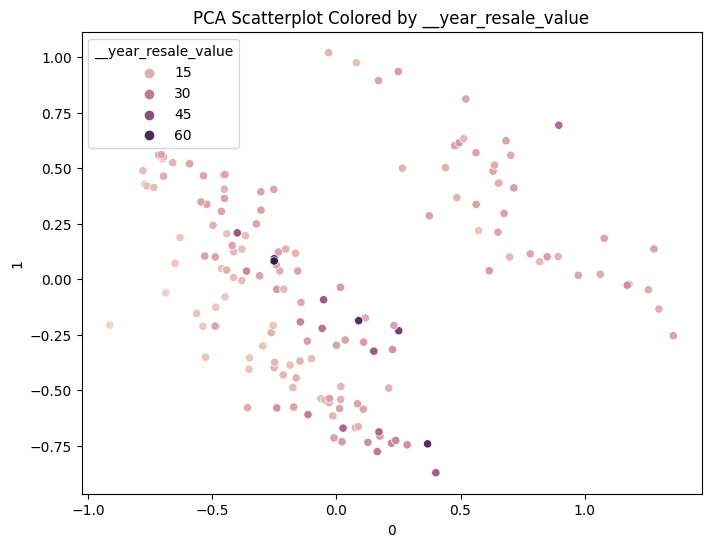

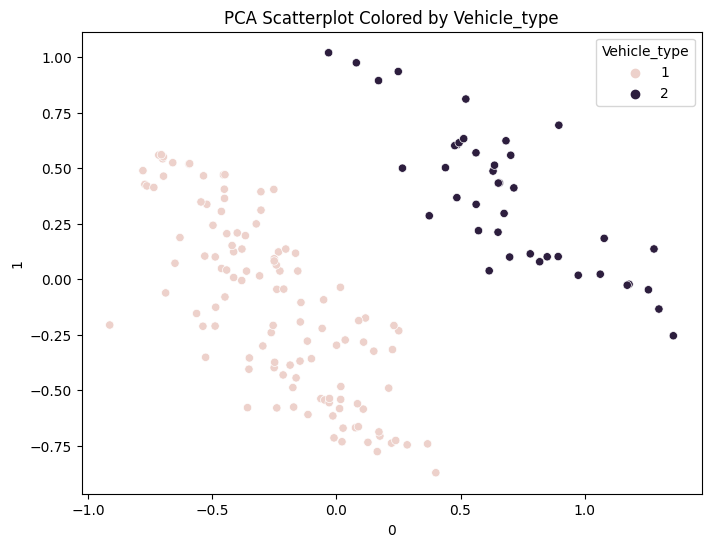

...

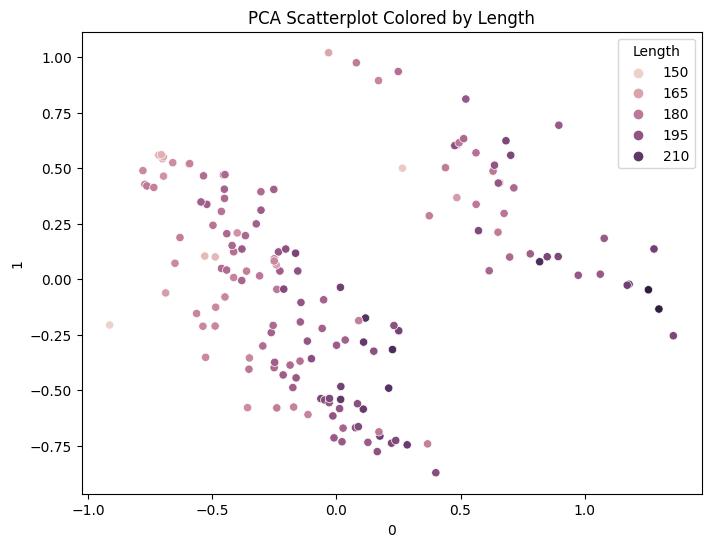

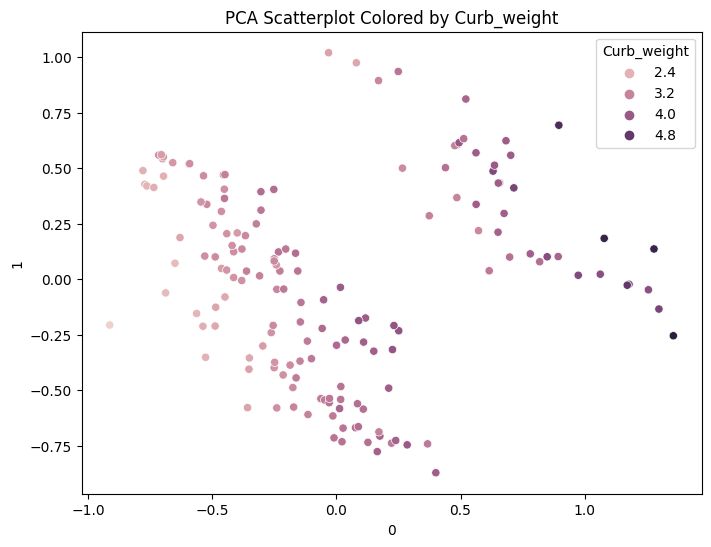

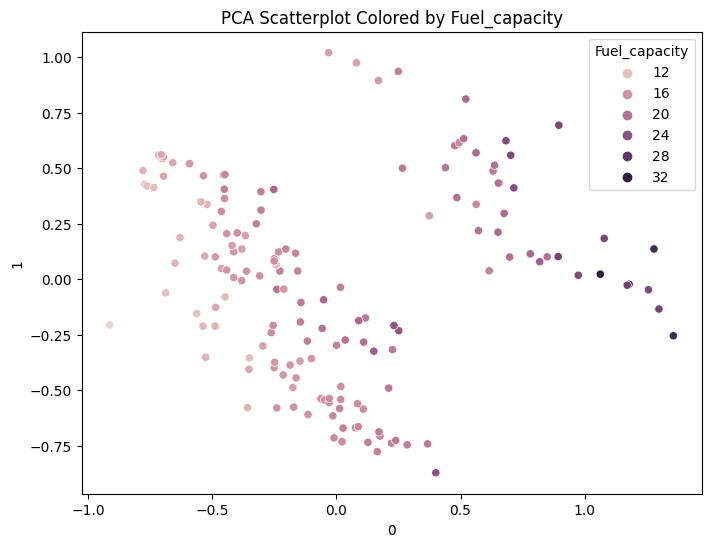

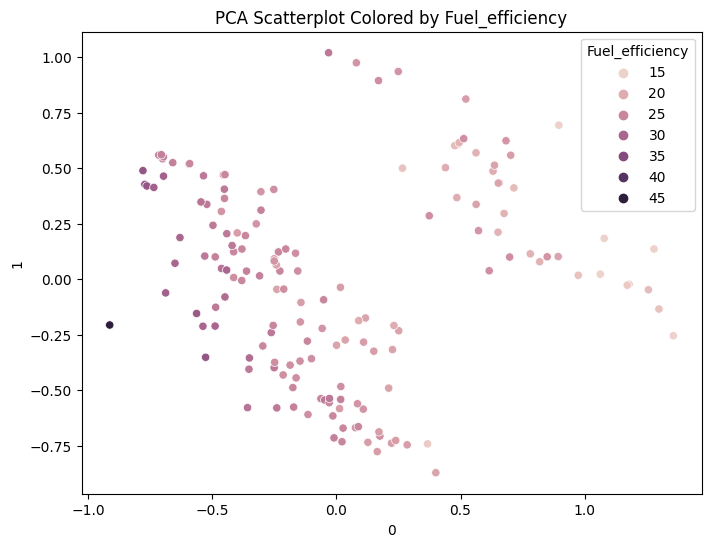

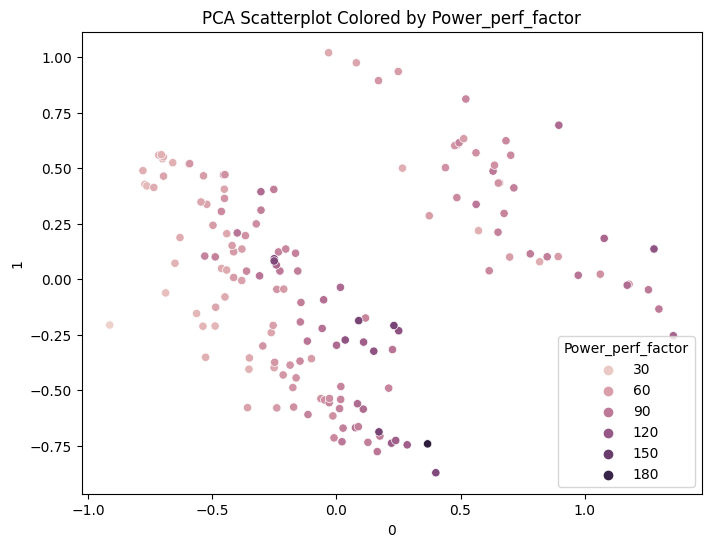

In [13]:
import matplotlib.pyplot as plt
for column in df.columns:
    if column == 'Latest_Launch':
      continue
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=pca_df[0], y=pca_df[1], hue=column,  data=df)
    plt.title(f'PCA Scatterplot Colored by {column}')
    plt.show()

* PCA seems to cleanly divide the groups by vehicle type, which is interesting

# K-Means Clustering w/ Visualization

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Text(0, 0.5, 'Variance')

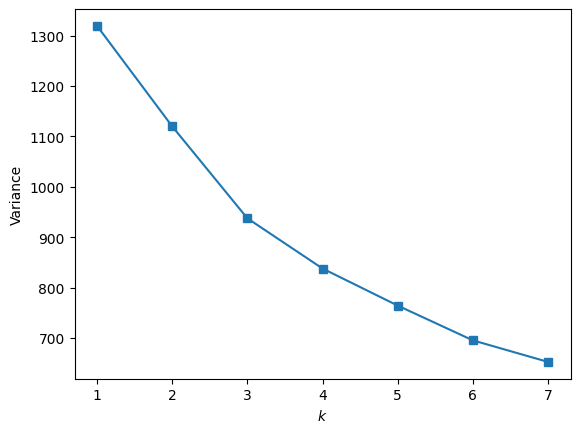

In [ ]:
import numpy as np
inertia = []
for k in range(1,8):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(data)
    inertia.append(np.sqrt(kmeans.inertia_))
plt.plot(range(1, 8), inertia, marker='s');
plt.xlabel('$k$')
plt.ylabel('Variance')
#https://www.geeksforgeeks.org/elbow-method-for-optimal-value-of-k-in-kmeans/

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<Axes: xlabel='0', ylabel='1'>

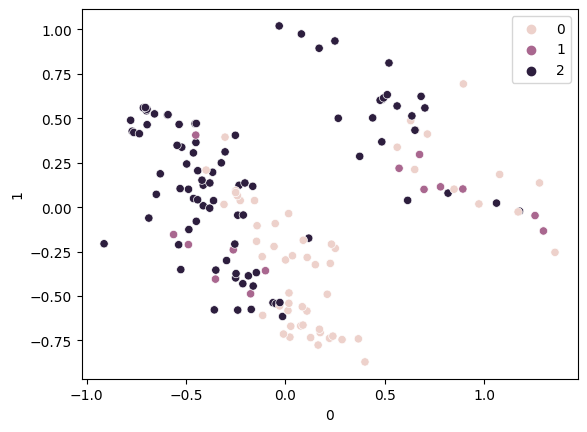

In [11]:
from sklearn.cluster import KMeans, AgglomerativeClustering

kmeans = KMeans(n_clusters=3, random_state=1).fit(data)
y = kmeans.fit_predict(data)
sns.scatterplot(x = pca_df[0], y = pca_df[1], hue=y)

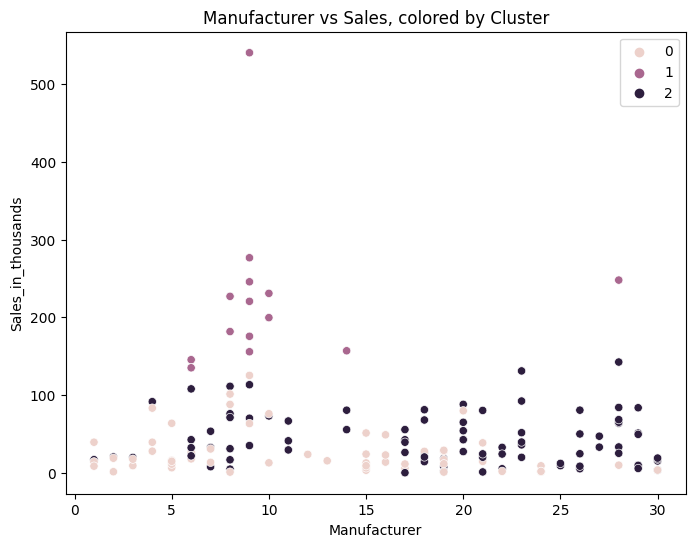

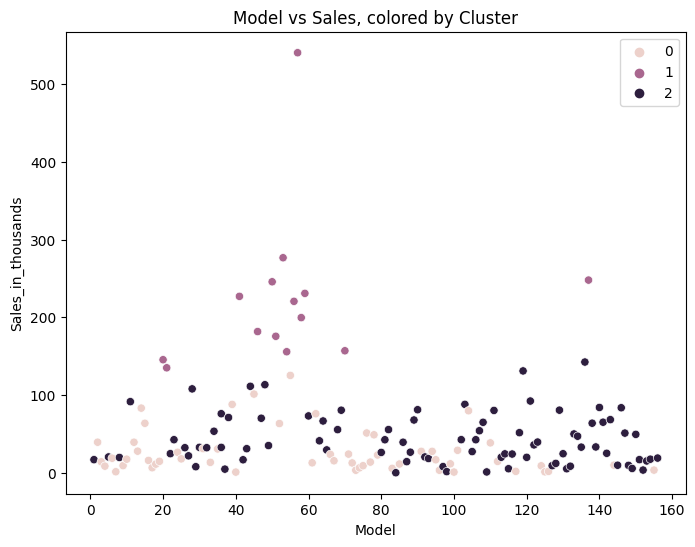

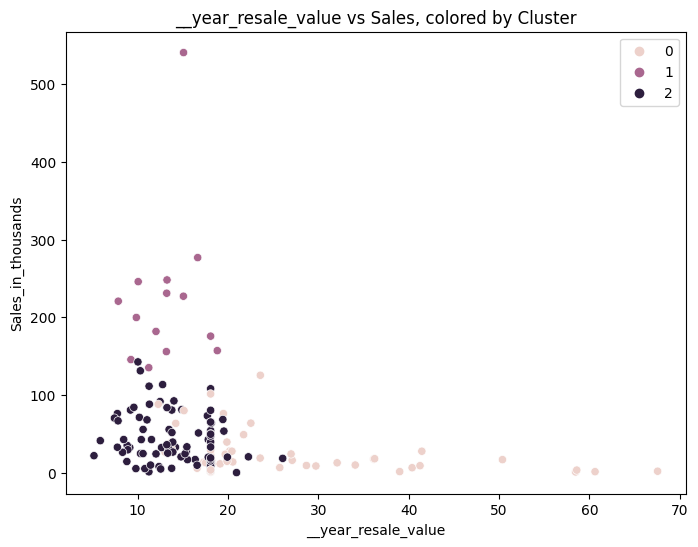

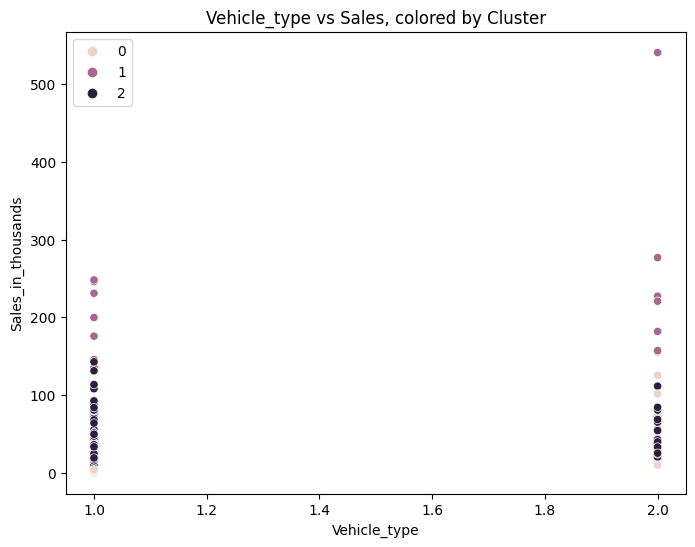

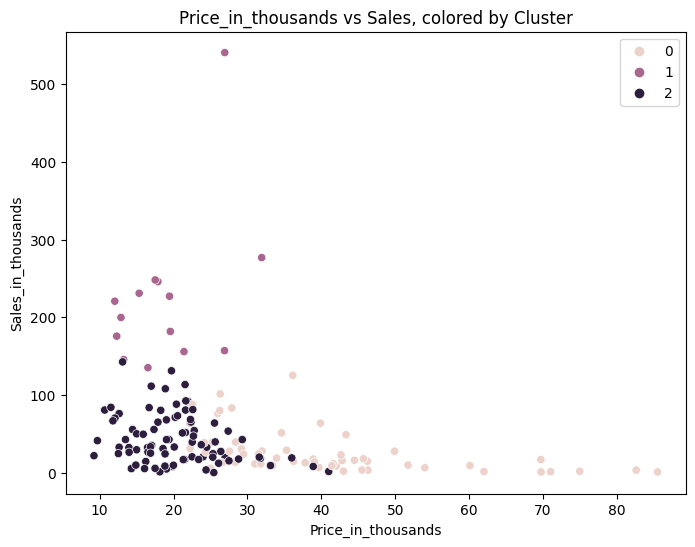

...

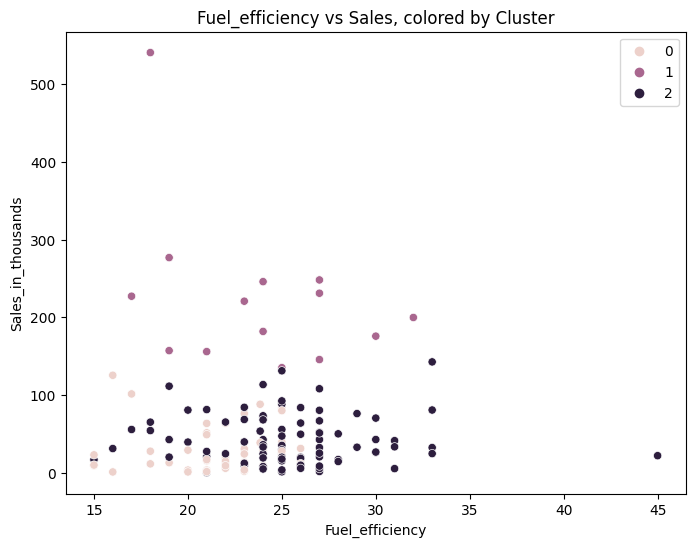

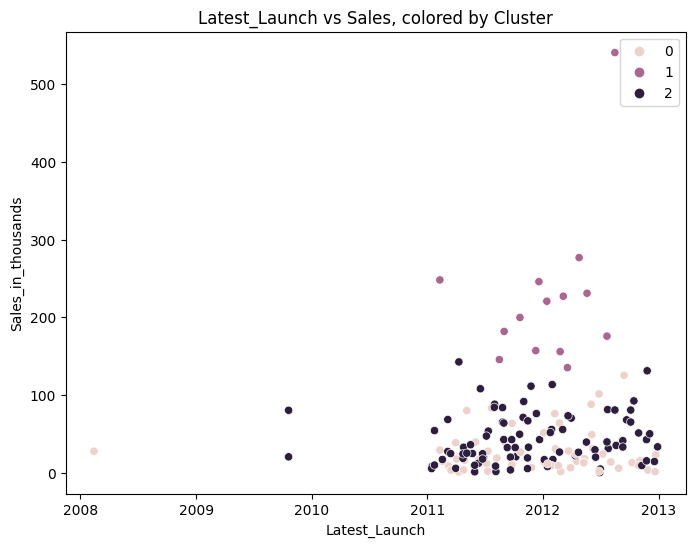

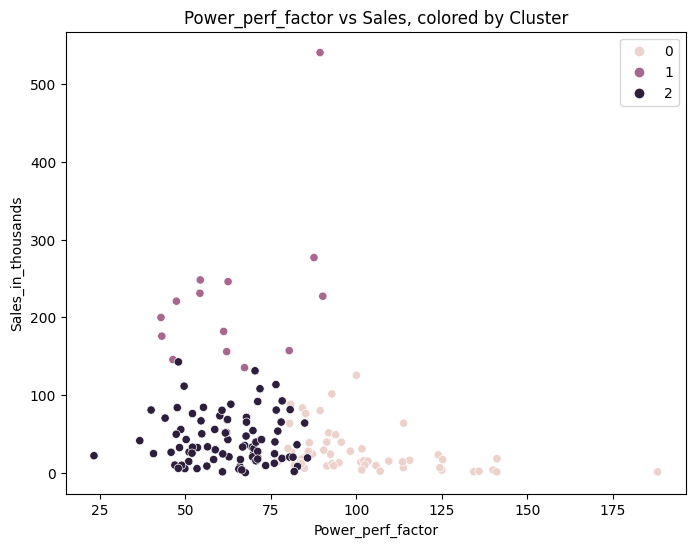

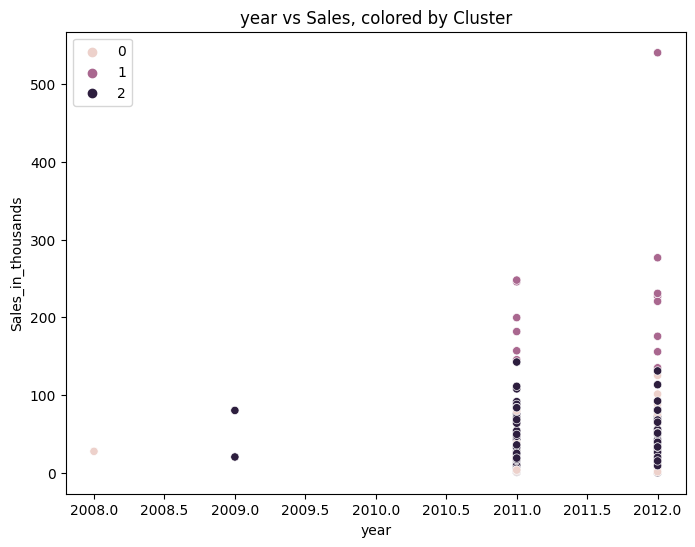

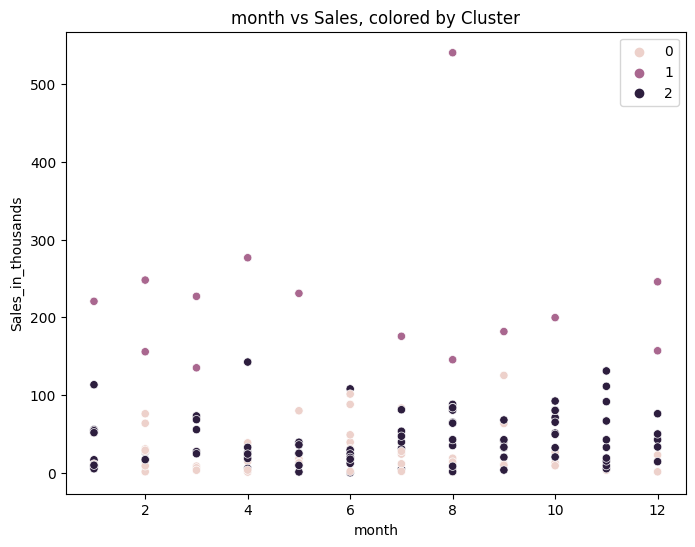

In [ ]:
for column in df.columns:
  if column == 'Sales_in_thousands':
    continue
  plt.figure(figsize=(8, 6))
  sns.scatterplot(x=df[column], y=df['Sales_in_thousands'], hue=y)
  plt.title(f'{column} vs Sales, colored by Cluster')
  plt.show()

* Cluster 2 seems to focus on lower value, lower performance vehicles
* Cluster 1 appears continually higher price than the others despite similar features, with a specific group of models/manufacturers
* Cluster 0 has noticeably higher resale value, initial price, horsepower, power performance factor,

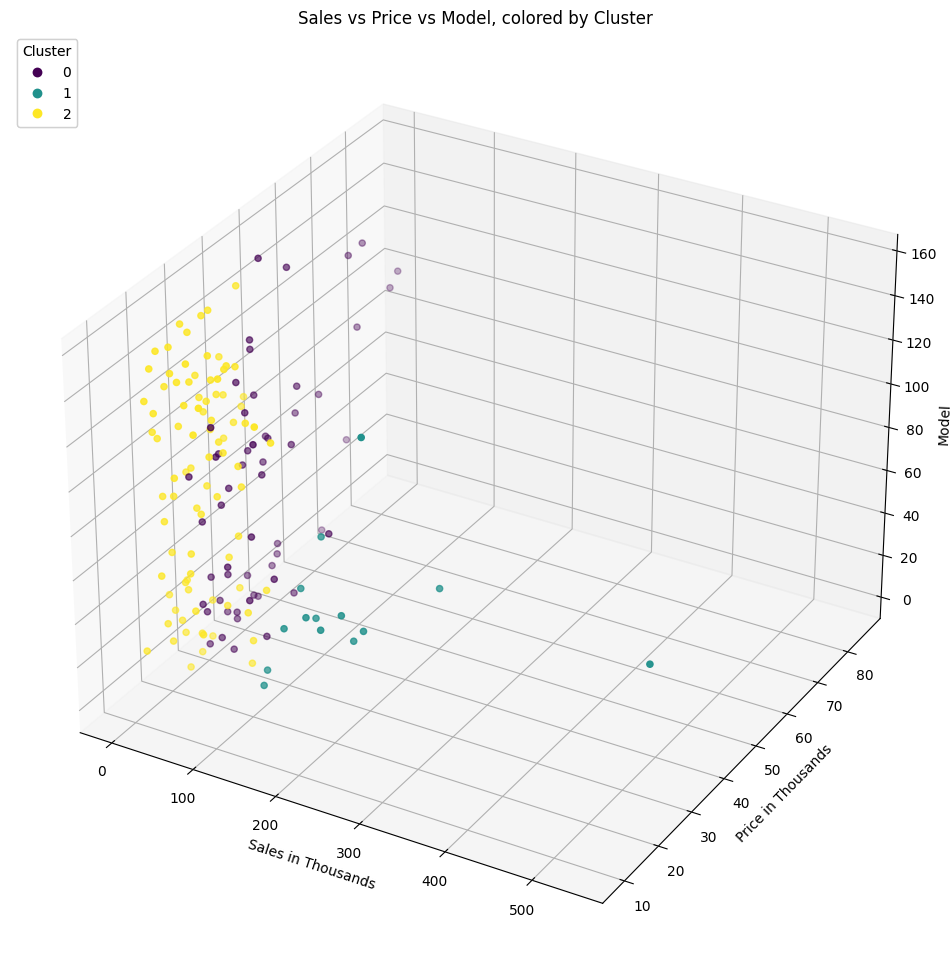

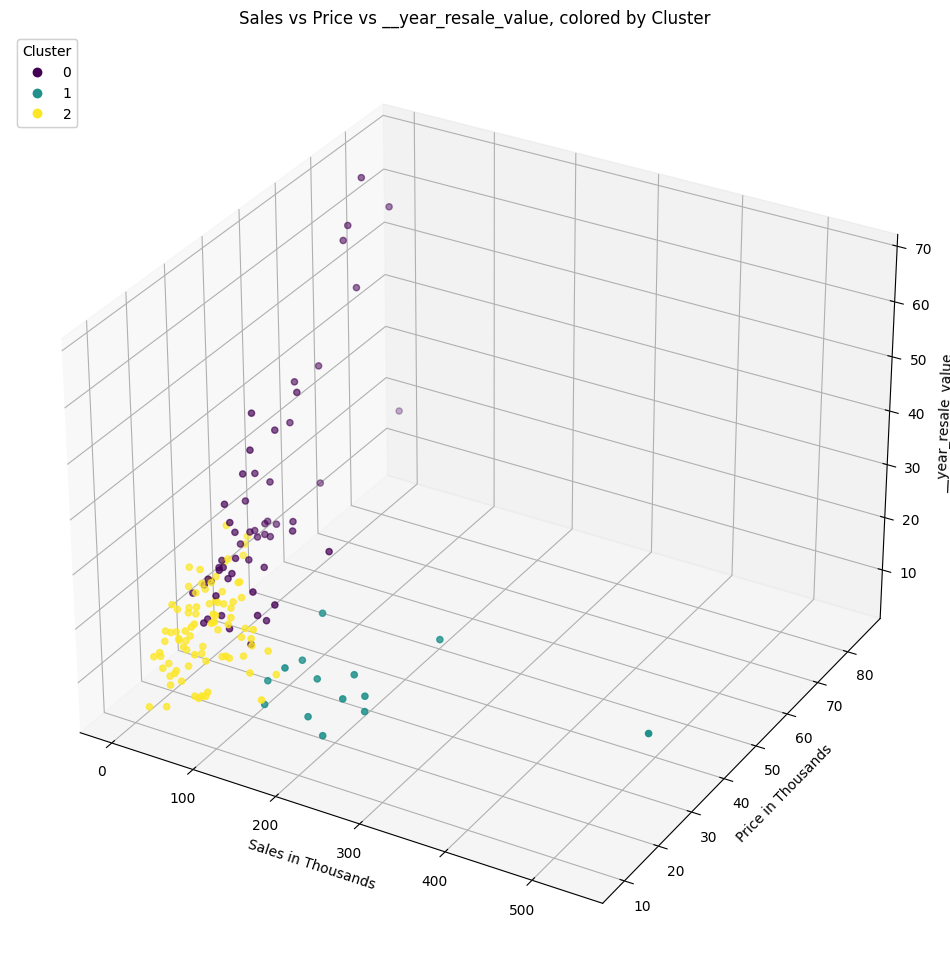

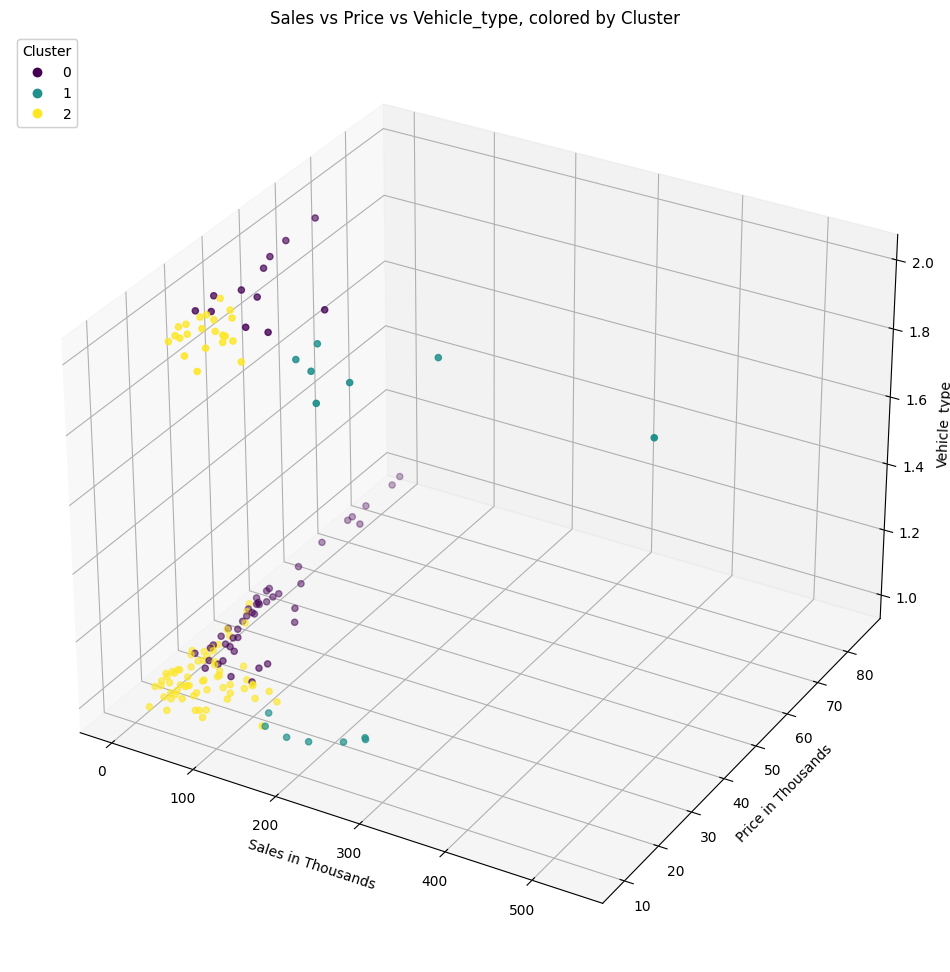

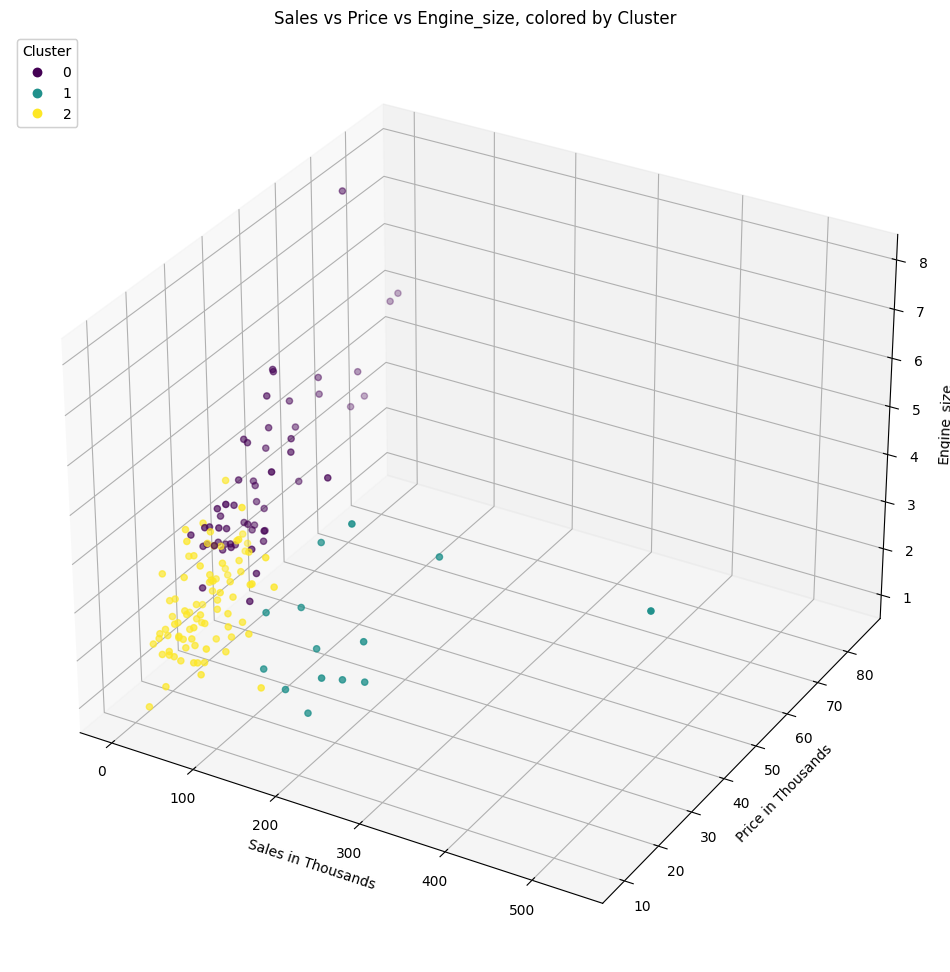

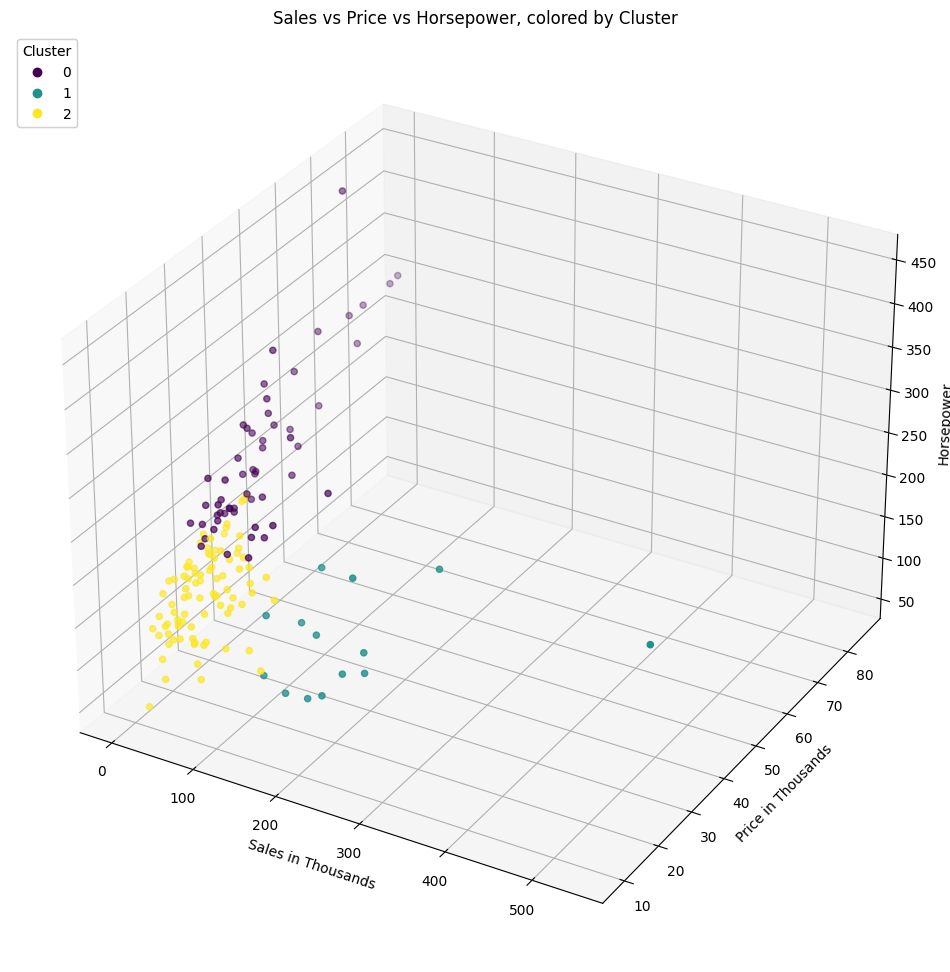

...

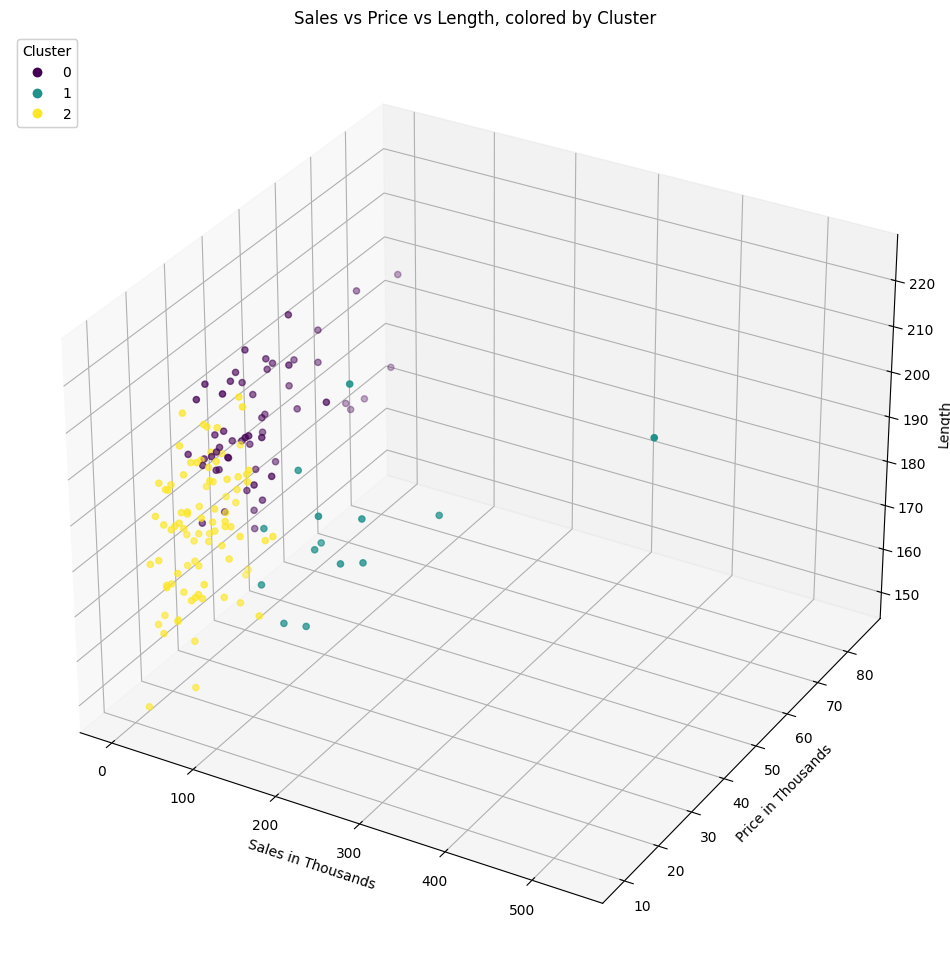

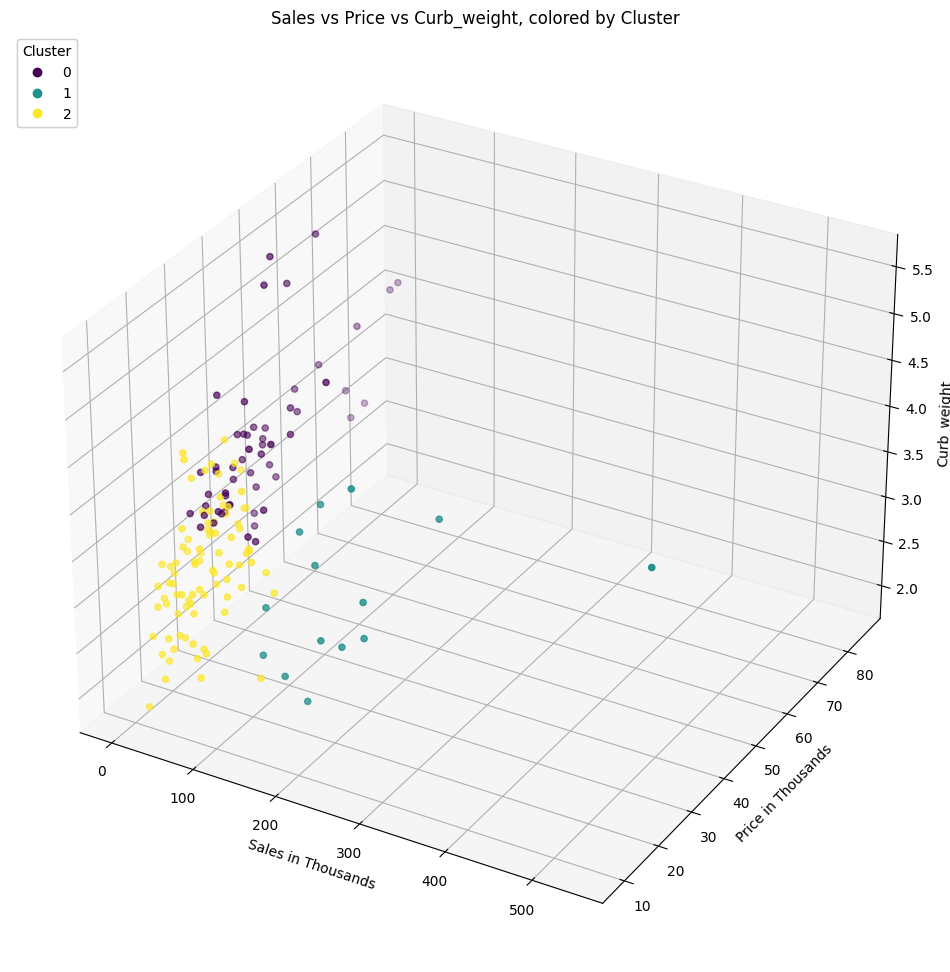

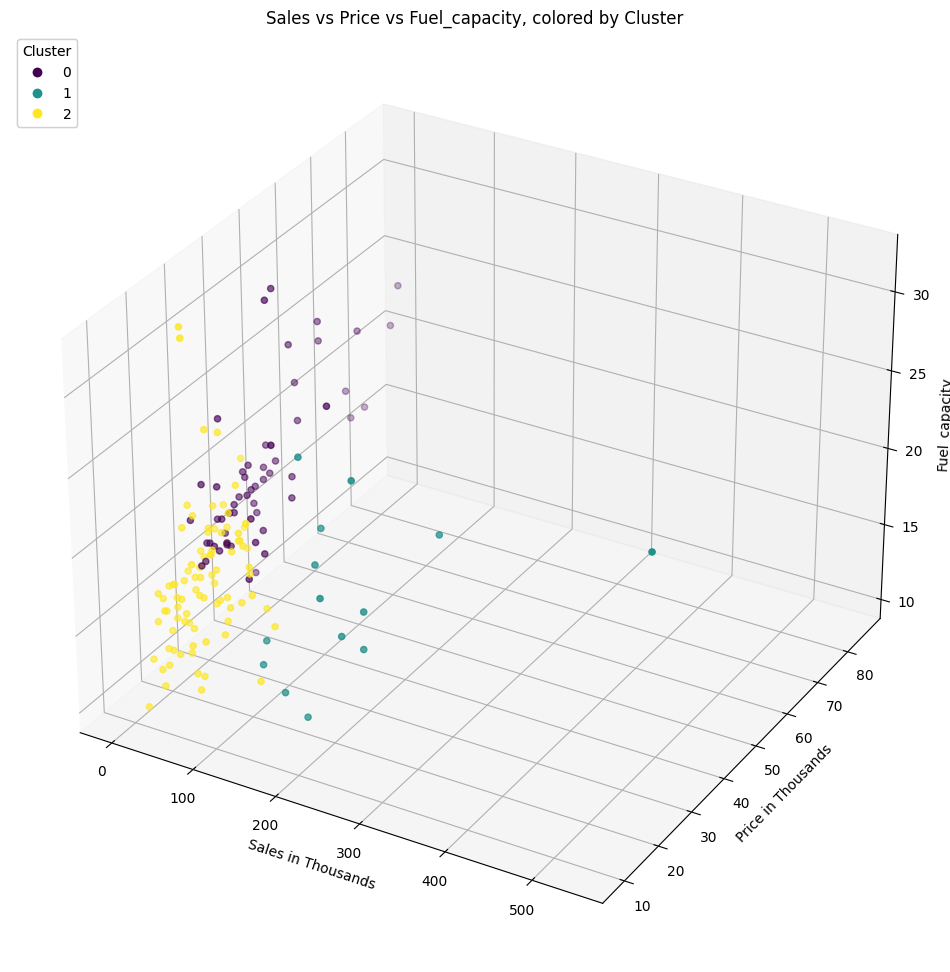

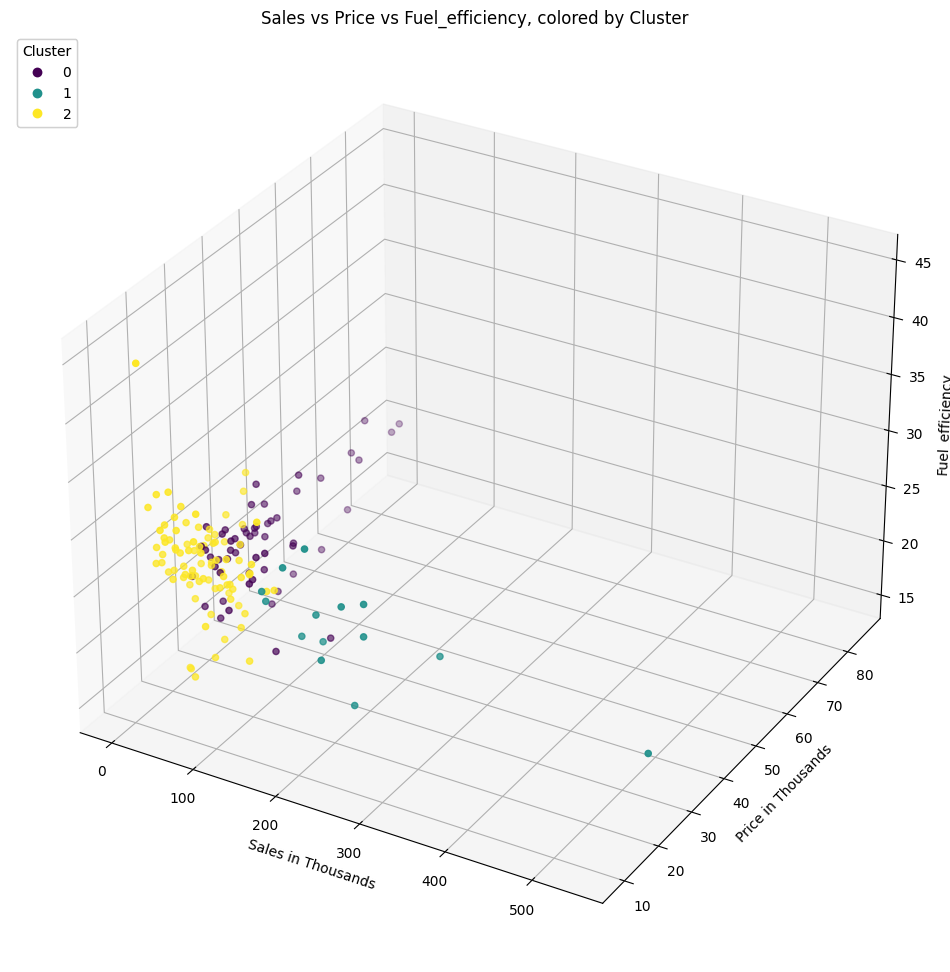

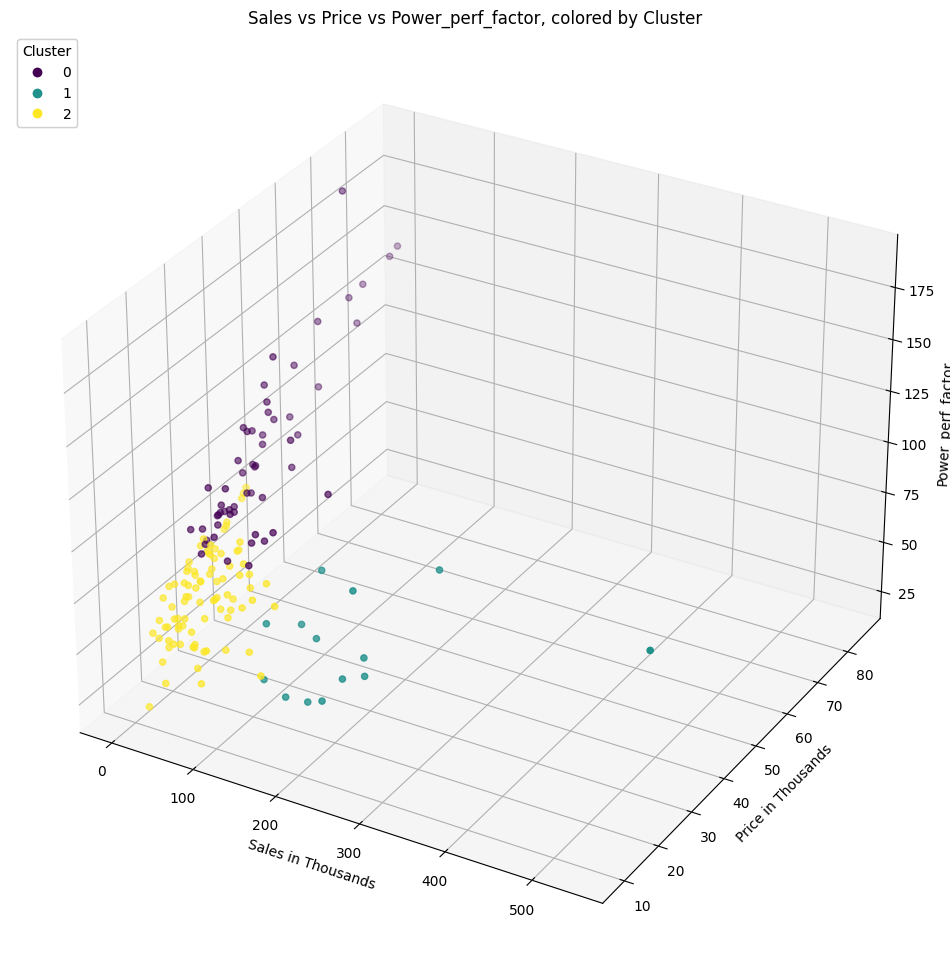

In [14]:
for column in df.columns:
    if column == 'Sales_in_thousands' or column == 'Latest_Launch' or column == 'Manufacturer' or column == 'Price_in_thousands':
      continue
    fig = plt.figure(figsize=(12, 14))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(df['Sales_in_thousands'], df['Price_in_thousands'], df[column] , c=y, cmap='viridis', marker='o')
    legend = ax.legend(*scatter.legend_elements(), title='Cluster', loc='upper left')
    ax.add_artist(legend)
    ax.set_xlabel('Sales in Thousands')
    ax.set_ylabel('Price in Thousands')
    ax.set_zlabel(column)
    ax.set_title(f'Sales vs Price vs {column}, colored by Cluster')
    plt.show()

# Analysis for Linear Regression

<ipython-input-119-20ad9e8d8f7b>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


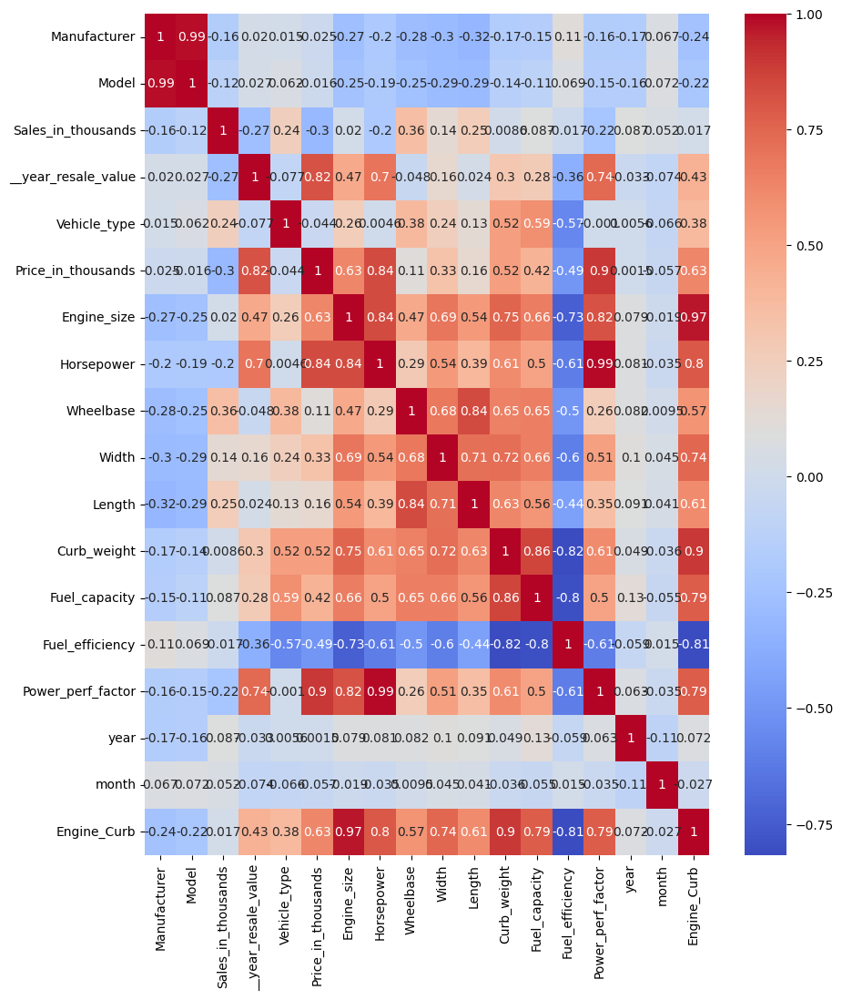

In [119]:
corr_matrix = df.corr()


# Create the heatmap using the `heatmap` function of Seaborn
plt.figure(figsize=(10, 12))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)


# Display the heatmap using the `show` method of the `pyplot` module from matplotlib.
plt.show()

In [ ]:
df

,Manufacturer,Model,Sales_in_thousands,__year_resale_value,Vehicle_type,Price_in_thousands,Engine_size,Horsepower,Wheelbase,Width,Length,Curb_weight,Fuel_capacity,Fuel_efficiency,Latest_Launch,Power_perf_factor,year,month
0,1,1,16.919,16.360000,1,21.500000,1.8,140.0,101.2,67.3,172.4,2.639,13.2,28.0,2012-02-02,58.280150,2012,2
1,1,2,39.384,19.875000,1,28.400000,3.2,225.0,108.1,70.3,192.9,3.517,17.2,25.0,2011-06-03,91.370778,2011,6
2,1,3,14.114,18.225000,1,27.390755,3.2,225.0,106.9,70.6,192.0,3.470,17.2,26.0,2012-01-04,77.043591,2012,1
3,1,4,8.588,29.725000,1,42.000000,3.5,210.0,114.6,71.4,196.6,3.850,18.0,22.0,2011-03-10,91.389779,2011,3
4,2,5,20.397,22.255000,1,23.990000,1.8,150.0,102.6,68.2,178.0,2.998,16.4,27.0,2011-10-08,62.777639,2011,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152,30,152,3.545,18.072975,1,24.400000,1.9,160.0,100.5,67.6,176.6,3.042,15.8,25.0,2011-09-21,66.498812,2011,9
153,30,153,15.245,18.072975,1,27.500000,2.4,168.0,104.9,69.3,185.9,3.208,17.9,25.0,2012-11-24,70.654495,2012,11
154,30,154,17.531,18.072975,1,28.800000,2.4,168.0,104.9,69.3,186.2,3.259,17.9,25.0,2011-06-25,71.155978,2011,6
155,30,155,3.493,18.072975,1,45.500000,2.3,236.0,104.9,71.5,185.7,3.601,18.5,23.0,2011-04-26,101.623357,2011,4


In [66]:
X = df.drop(['Sales_in_thousands', 'Latest_Launch'], axis=1)
y = df['Sales_in_thousands']
import statsmodels.api as sm
X2 = sm.add_constant(X)
est = sm.OLS(y, X2)
est2 = est.fit()
est2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     Sales_in_thousands   R-squared:                       0.367
Model:                            OLS   Adj. R-squared:                  0.294
Method:                 Least Squares   F-statistic:                     5.067
Date:                Thu, 07 Dec 2023   Prob (F-statistic):           3.32e-08
Time:                        17:32:27   Log-Likelihood:                -848.94
No. Observations:                 157   AIC:                             1732.
Df Residuals:                     140   BIC:                             1784.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const               -1.345e+04   1.53e+04     -0.880      0.381   -4.37e+04    1.68e+04
Manufacturer           -7.6083      3.357     -2.266      0.025     -14.246      -0.970
Model                   1.3779      0.639      2.156      0.033       0.114       2.642
__year_resale_value     0.4985      0.879      0.567      0.572      -1.240       2.237
Vehicle_type           36.8261     18.882      1.950      0.053      -0.504      74.156
Price_in_thousands     -0.7301      1.939     -0.376      0.707      -4.564       3.104
Engine_size            29.0894     11.044      2.634      0.009       7.254      50.925
Horsepower             -0.9803      1.492     -0.657      0.512      -3.930       1.970
Wheelbase               3.6477      1.367      2.669      0.008       0.946       6.349
Width                   1.3824      2.428      0.569      0.570      -3.419       6.184
Length                  0.5120      0.817      0.627      0.532      -1.102       2.126
Curb_weight           -52.4882     20.800     -2.523      0.013     -93.611     -11.365
Fuel_capacity          -1.8652      2.786     -0.670      0.504      -7.372       3.642
Fuel_efficiency         0.6454      2.328      0.277      0.782      -3.958       5.248
Power_perf_factor       1.3014      4.253      0.306      0.760      -7.106       9.709
year                    6.4987      7.599      0.855      0.394      -8.525      21.523
month                   0.6327      1.399      0.452      0.652      -2.133       3.399
==============================================================================
Omnibus:                      101.931   Durbin-Watson:                   1.402
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              747.693
Skew:                           2.311   Prob(JB):                    4.37e-163
Kurtosis:                      12.640   Cond. No.                     6.83e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.83e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

We want features with high significance scores (P <= 0.05), so I am selecting...
* Manufacturer
* Model
* Engine_size
* Wheelbase
* Curb_weight
* Vehicle type (though outside our significance range, our experiments with clustering showed that vehicle type can be used to group cars easily)

In [74]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd

X = df[['Manufacturer', 'Model', 'Vehicle_type', 'Engine_size', 'Wheelbase', 'Curb_weight']]
ds=pd.Series([variance_inflation_factor(X.values, i)
               for i in range(X.shape[1])],
              index=X.columns)
print(ds)
#https://medium.com/analytics-vidhya/how-to-check-for-assumptions-in-a-linear-regression-a68116aef88a
#https://statisticsbyjim.com/regression/multicollinearity-in-regression-analysis/

Manufacturer    156.473858
Model           148.921624
Vehicle_type     14.107076
Engine_size      24.894849
Wheelbase        56.868421
Curb_weight     114.697912
dtype: float64


We have extremely high VIF, so lets check out the correlation to see where to go from here

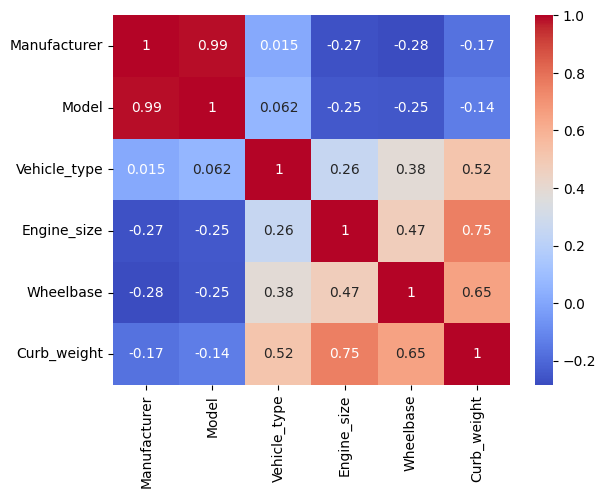

In [75]:
import matplotlib.pyplot as plt

import seaborn as sns
corr_matrix = X.corr()


# Create the heatmap using the `heatmap` function of Seaborn

sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)


# Display the heatmap using the `show` method of the `pyplot` module from matplotlib.
plt.show()

Manufacturer and Model are highly correlated, so we should drop Model. This is for 2 main reasons
1. Multicolinearity hurts model performance
2. In general, predicting a car's sales based on its Manufacturer and Model isn't very interesting

We can consider several approaches to improving the other features
* Combine Engine_size and Curb_weight
* Use PCA to create new uncorrelated variables


In [82]:
# Test for heteroskedasticity using the White test
# NOTE: statsmodels refers to X variables as `exog` for exogenous
lm, lm_pvalue, fvalue, f_pvalue = sm.stats.diagnostic.het_white(res_sm.resid, res_sm.model.exog)

print("Lagrange multiplier statistic: " + str(lm))
print("Lagrange multiplier p-value:   " + str(lm_pvalue))
print("F-statistic:                   " + str(fvalue))
print("P-value of F-statistic:        " + str(f_pvalue))

# If the p-value is less than the chosen significance level (e.g. 0.05),
# reject the null hypothesis of homoscedasticity
if lm_pvalue < 0.05:
    print("Rejected the null hypothesis. Heteroskedasticity detected")
else:
    print("Failed to reject the null hypothesis. No heteroskedasticity detected.")
#https://www.einblick.ai/python-code-examples/white-heteroskedasticity-test-python/

Lagrange multiplier statistic: 151.68644318927747
Lagrange multiplier p-value:   0.16930807950278973
F-statistic:                   4.198097559766718
P-value of F-statistic:        0.0002720369022707412
Failed to reject the null hypothesis. No heteroskedasticity detected.


No heteroskedasticity, so that's good. Let's check if our errors are normally distributed

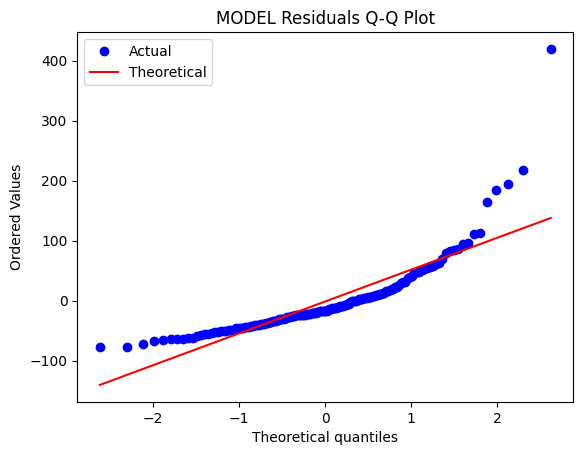

In [86]:
X = df[['Manufacturer', 'Vehicle_type', 'Engine_size', 'Wheelbase', 'Curb_weight']]
y = df['Sales_in_thousands']
import statsmodels.api as sm
model = sm.OLS(y,X).fit()
#Import library
from scipy import stats
stats.probplot(model.resid, dist="norm", plot= plt)
plt.title("MODEL Residuals Q-Q Plot")
plt.legend(['Actual','Theoretical'])
#https://sscc.wisc.edu/sscc/pubs/RegDiag-R/normality.html#skew

It looks like our data is positively skewed, which we will need to fix

In [83]:
X = df[['Manufacturer', 'Vehicle_type', 'Engine_size', 'Wheelbase', 'Curb_weight']]
y = df['Sales_in_thousands']
import statsmodels.api as sm
X2 = sm.add_constant(X)
est = sm.OLS(y, X2)
est2 = est.fit()
est2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     Sales_in_thousands   R-squared:                       0.290
Model:                            OLS   Adj. R-squared:                  0.266
Method:                 Least Squares   F-statistic:                     12.33
Date:                Thu, 07 Dec 2023   Prob (F-statistic):           4.94e-10
Time:                        17:52:26   Log-Likelihood:                -857.93
No. Observations:                 157   AIC:                             1728.
Df Residuals:                     151   BIC:                             1746.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         -335.0395     76.155     -4.399      0.000    -485.506    -184.573
Manufacturer    -0.6090      0.583     -1.044      0.298      -1.762       0.544
Vehicle_type    49.7744     12.826      3.881      0.000      24.433      75.115
Engine_size      8.5888      7.179      1.196      0.233      -5.596      22.774
Wheelbase        5.0465      0.836      6.040      0.000       3.396       6.697
Curb_weight    -69.2684     14.706     -4.710      0.000     -98.325     -40.212
==============================================================================
Omnibus:                       98.394   Durbin-Watson:                   1.238
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              637.767
Skew:                           2.265   Prob(JB):                    3.24e-139
Kurtosis:                      11.774   Cond. No.                     1.79e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.79e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

No heteroskedasticity detected, so that's good.
For our experiment, lets try a few different models to see which functions best

*Our main issues are...*
1. High multicolinearity
2. Lack of predictive power in variables
3. Positively skewed data

Here are the different models we will try out to fix this
1. Basic Model = Normal features, power-transform, linear regression
2. Combined Model = Combined Engine_size and Curb_weight, power transform, linear regression
3. PCA Model = PCA on features 95% variance explained, power transform, linear regression
https://medium.com/@sjacks/feature-transformation-21282d1a3215

# Actual Linear Regression

In [9]:
X = df[['Manufacturer', 'Vehicle_type', 'Engine_size', 'Wheelbase', 'Curb_weight']]
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer()
X = scaler.fit_transform(X)
y = df['Sales_in_thousands']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=0)
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error #manual says its equivalent to RMSE if not squared so
lreg = LinearRegression().fit(X_train, y_train)
normal_pred = lreg.predict(X_test)
print(f"RMSE = {mean_squared_error(y_test, normal_pred, squared=False)}, r^2 = {r2_score(y_test, normal_pred)}")

RMSE = 89.70375619648199, r^2 = 0.20747862429804387


In [10]:
df['Engine_Curb'] = df['Engine_size'].astype(float) + df['Curb_weight']
#https://saturncloud.io/blog/how-to-combine-two-columns-in-a-pandas-dataframe/

X = df[['Manufacturer', 'Vehicle_type', 'Engine_Curb', 'Wheelbase']]
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer()
X = scaler.fit_transform(X)
y = df['Sales_in_thousands']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=0)
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error #manual says its equivalent to RMSE if not squared so
lreg = LinearRegression().fit(X_train, y_train)
combined_pred = lreg.predict(X_test)
print(f"RMSE = {mean_squared_error(y_test, combined_pred, squared=False)}, r^2 = {r2_score(y_test, combined_pred)}")

RMSE = 94.43169324208215, r^2 = 0.12173559591049932


In [11]:
X = df[['Manufacturer', 'Vehicle_type', 'Engine_size', 'Wheelbase', 'Curb_weight']]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer()
X = scaler.fit_transform(X)
from sklearn.decomposition import PCA
pca = PCA(n_components=0.95)
X = pd.DataFrame(pca.fit_transform(X))

y = df['Sales_in_thousands']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=0)

from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error #manual says its equivalent to RMSE if not squared so
lreg = LinearRegression().fit(X_train, y_train)
pca_pred = lreg.predict(X_test)
print(f"RMSE = {mean_squared_error(y_test, pca_pred, squared=False)}, r^2 = {r2_score(y_test, pca_pred)}")

RMSE = 95.47336922226125, r^2 = 0.10225245734033761


Text(0.5, 1.0, 'Regression Accuracy')

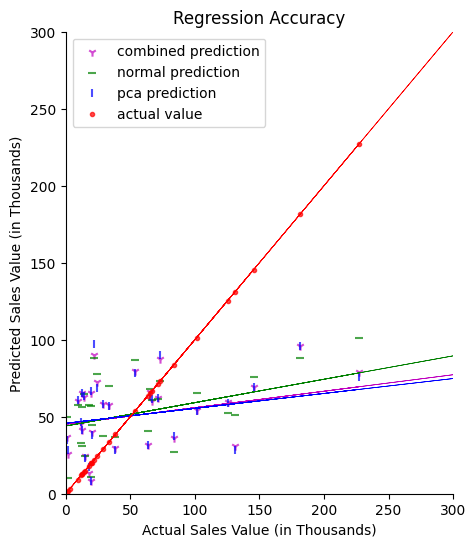

In [46]:
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(5, 6))
plt.ylim(0, 300)
plt.xlim(0, 300)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.scatter(y_test, y=combined_pred, c='m', label='combined prediction', marker='1', alpha=0.7)
plt.scatter(y_test, y=normal_pred, c='g', label='normal prediction', marker='_', alpha=0.7)
plt.scatter(y_test, y=pca_pred, c='b', label='pca prediction', marker='|', alpha=0.7)
plt.scatter(y_test, y=y_test, c='r', label='actual value', marker='.', alpha=0.7)

c_slope, c_intercept = np.polyfit(y_test, combined_pred, 1)
plt.plot(y_test, c_slope*y_test + c_intercept, color='m', linewidth=0.5)

n_slope, n_intercept = np.polyfit(y_test, normal_pred, 1)
plt.plot(y_test, n_slope*y_test + n_intercept, color='g', linewidth=0.5)

p_slope, p_intercept = np.polyfit(y_test, pca_pred, 1)
plt.plot(y_test, p_slope*y_test + p_intercept, color='b', linewidth=0.5)

a_slope, a_intercept = np.polyfit(y_test, y_test, 1)
plt.plot(y_test, a_slope*y_test + a_intercept, color='r', linewidth=0.5)

plt.xlabel("Actual Sales Value (in Thousands)")
plt.ylabel("Predicted Sales Value (in Thousands)")



#add legend
plt.legend(loc='upper left')

plt.title("Regression Accuracy")
#https://linuxhint.com/matplotlib-trendline/
#https://towardsdatascience.com/simple-ways-to-improve-your-matplotlib-b64eebccfd5